In [1]:
# Jupyter notebook related
%reload_ext autoreload
%autoreload 2
%matplotlib inline

# Built-in modules
import pickle, sys, os, datetime, itertools, rasterio, pandas as pd, mapclassify.classifiers as classifiers
import matplotlib.pyplot as plt, numpy as np, geopandas as gpd, matplotlib as mpl, matplotlib.gridspec as gridspec
import joblib, fiona, rasterio.mask, matplotlib, earthpy.plot as ep
from matplotlib.colors import ListedColormap, BoundaryNorm
from mpl_toolkits.axes_grid1 import make_axes_locatable
from shapely.geometry import Polygon
from rasterio.warp import transform
from osgeo import gdal, gdal_array
from sklearn import preprocessing
from aenum import MultiValueEnum
from rasterio.plot import show
from matplotlib import pyplot
from sklearn import metrics, cluster
from tqdm.auto import tqdm
from rasterio import plot 
import lightgbm as lgb

gdal.UseExceptions()
gdal.AllRegister()

In [2]:
# Imports from eo-learn and sentinelhub-py
from eolearn.core import EOTask, EOPatch, LinearWorkflow, FeatureType, OverwritePermission, \
    LoadTask, SaveTask, EOExecutor, ExtractBandsTask, MergeFeatureTask
from eolearn.io import SentinelHubInputTask, ExportToTiff
from eolearn.mask import AddMultiCloudMaskTask, AddValidDataMaskTask
from eolearn.geometry import VectorToRaster, PointSamplingTask, ErosionTask
from eolearn.features import LinearInterpolation, SimpleFilterTask, NormalizedDifferenceIndexTask
from sentinelhub import UtmZoneSplitter, BBox, CRS, DataCollection

In [4]:
# Load shp file
country = gpd.read_file("Training/Piemonte.shp")

/Users/magio94/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Dimension of the area is 203681 x 266467 m2


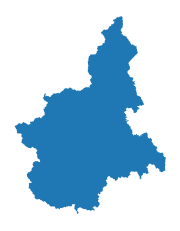

In [5]:
# Get the country's shape in polygon format
country_shape = country.geometry.values[-1]

# Plot country
country.plot()
plt.axis('off');

# Print size 
print('Dimension of the area is {0:.0f} x {1:.0f} m2'.format(country_shape.bounds[2] - country_shape.bounds[0],
                                                             country_shape.bounds[3] - country_shape.bounds[1]))

In [6]:
# Create the splitter to obtain a list of bboxes
bbox_splitter = UtmZoneSplitter([country_shape], country.crs, 5000)

bbox_list = np.array(bbox_splitter.get_bbox_list())
info_list = np.array(bbox_splitter.get_info_list())

# Prepare info of selected EOPatches
geometry = [Polygon(bbox.get_polygon()) for bbox in bbox_list]
idxs = [info['index'] for info in info_list]
idxs_x = [info['index_x'] for info in info_list]
idxs_y = [info['index_y'] for info in info_list]

gdf = gpd.GeoDataFrame({'index': idxs, 'index_x': idxs_x, 'index_y': idxs_y}, 
                           crs=country.crs, 
                           geometry=geometry)

/Users/magio94/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [7]:
# select a 5x5 area (id of center patch)
ID = 1048

# Obtain surrounding 5x5 patches
patchIDs = []
for idx, [bbox, info] in enumerate(zip(bbox_list, info_list)):
    if (abs(info['index_x'] - info_list[ID]['index_x']) <= 2 and
        abs(info['index_y'] - info_list[ID]['index_y']) <= 2):
        patchIDs.append(idx)

# Check if final size is 5x5
if len(patchIDs) != 5*5:
    print('Warning! Use a different central patch ID, this one is on the border.')
    
# Change the order of the patches (used for plotting later)
patchIDs = np.transpose(np.fliplr(np.array(patchIDs).reshape(5, 5))).ravel()

# save to shapefile
shapefile_name = 'Training/grid_Piemonte_500x500.shp'
gdf.to_file(shapefile_name)

/Users/magio94/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### Visualize the selection

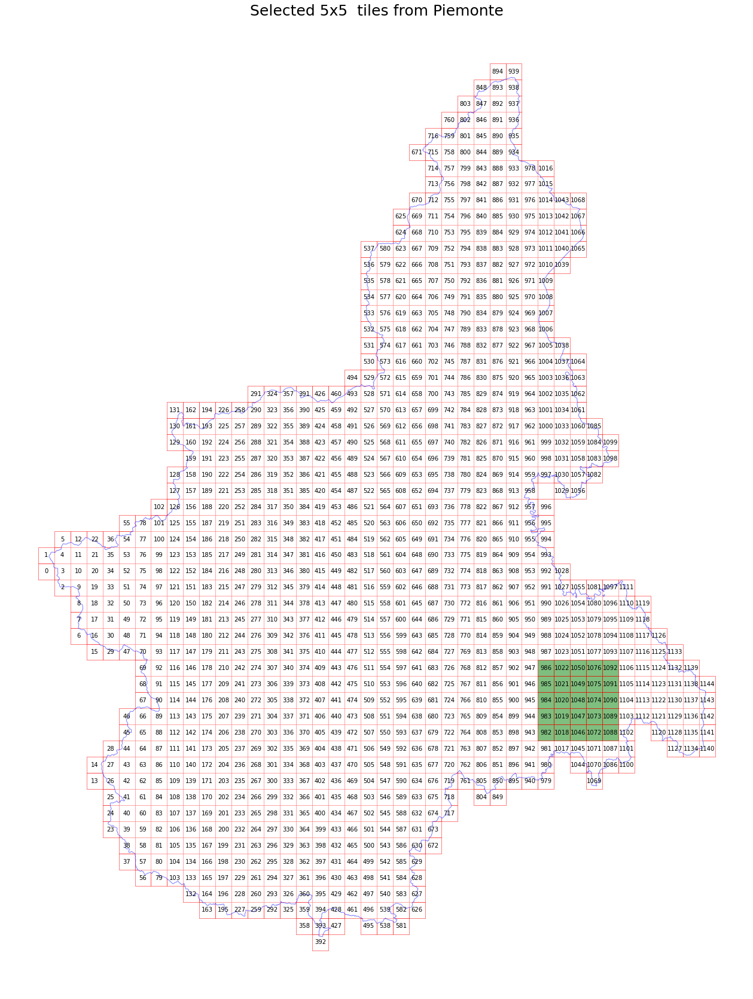

In [8]:
# figure
fig, ax = plt.subplots(figsize=(30, 30))
gdf.plot(ax=ax,facecolor='w',edgecolor='r',alpha=0.5)
country.plot(ax=ax, facecolor='w',edgecolor='b',alpha=0.5)
ax.set_title('Selected 5x5  tiles from Piemonte', fontsize=25);
for bbox, info in zip(bbox_list, info_list):
    geo = bbox.geometry
    ax.text(geo.centroid.x, geo.centroid.y, info['index'], ha='center', va='center')
    
gdf[gdf.index.isin(patchIDs)].plot(ax=ax,facecolor='g',edgecolor='r',alpha=0.5)

plt.axis('off');

In [9]:
shapefile_grid = gpd.read_file('Training/grid_Piemonte_500x500.shp')

/Users/magio94/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [10]:
selected_cells = shapefile_grid.loc[shapefile_grid['index'].isin(patchIDs)]

In [11]:
# save to shapefile
selected_cells.to_file('Training/selection_grid.shp')

In [ ]:
dem_plt = rasterio.open('GIS/DEM/piemonte_dem.tif')

fig, ax = plt.subplots(figsize=(30, 30))
az = selected_cells.plot(ax=ax, facecolor='None', linewidth=1.6, edgecolor='red')

fig = plt.figure(figsize=(15, 15))
plot.show(dem_plt, cmap='terrain', ax=ax)

In [12]:
CLC2018_Piemonte = gpd.read_file('project/dati elaborati/CLC2018_piemonte.shp')
CLC2018_legend = pd.read_excel('GIS/u2018_clc2018_v2020_20u1_fgdb/Legend/clc_legend.xls')

In [13]:
pd.set_option('display.max_rows', 120)
CLC2018_Piemonte.dtypes

Code_18         object
Remark          object
Area_Ha        float64
ID              object
Shape_Leng     float64
Shape_Area     float64
geometry      geometry
dtype: object

In [14]:
pd.set_option('display.max_rows', 120)
CLC2018_legend.dtypes

GRID_CODE     int64
CLC_CODE      int64
LABEL1       object
LABEL2       object
LABEL3       object
RGB          object
dtype: object

In [15]:
CLC2018_Piemonte['Code_18'] = CLC2018_Piemonte['Code_18'].astype( 'int64' )

In [16]:
CLC2018_join = pd.merge(CLC2018_Piemonte, CLC2018_legend, left_on="Code_18", right_on="CLC_CODE")

In [17]:
CLC2018_join

,Code_18,Remark,Area_Ha,ID,Shape_Leng,Shape_Area,geometry,GRID_CODE,CLC_CODE,LABEL1,LABEL2,LABEL3,RGB
0,111,None,28.529139,EU_341348,3335.724214,2.852914e+05,"POLYGON ((4109016.440 2405361.280, 4108967.500...",1,111,Artificial surfaces,Urban fabric,Continuous urban fabric,230-000-077
1,111,None,42.463397,EU_341354,3454.290063,4.246340e+05,"POLYGON ((4109710.610 2423710.510, 4109739.060...",1,111,Artificial surfaces,Urban fabric,Continuous urban fabric,230-000-077
2,111,None,30.304304,EU_766321,2600.589442,3.030430e+05,"POLYGON ((4135576.430 2360209.360, 4135544.010...",1,111,Artificial surfaces,Urban fabric,Continuous urban fabric,230-000-077
3,111,None,31.423026,EU_766322,2416.687883,3.142303e+05,"POLYGON ((4125290.110 2361020.680, 4125351.690...",1,111,Artificial surfaces,Urban fabric,Continuous urban fabric,230-000-077
4,111,None,99.953174,EU_766327,4891.871668,9.995317e+05,"POLYGON ((4125618.220 2367588.220, 4125615.040...",1,111,Artificial surfaces,Urban fabric,Continuous urban fabric,230-000-077
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9256,241,None,224.007875,EU_780393,12706.097125,2.240079e+06,"POLYGON ((4163840.490 2459427.420, 4163841.990...",19,241,Agricultural areas,Heterogeneous agricultural areas,Annual crops associated with permanent crops,255-230-166
9257,334,None,997.292451,EU_804259,24085.251266,9.972925e+06,"POLYGON ((4122200.420 2483513.750, 4122119.440...",33,334,Forest and semi natural areas,Open spaces with little or no vegetation,Burnt areas,000-000-000
9258,411,None,32.452059,EU_804440,2737.813551,3.245206e+05,"POLYGON ((4189212.030 2450588.380, 4189212.420...",35,411,Wetlands,Inland wetlands,Inland marshes,166-166-255
9259,411,None,36.942741,EU_804446,2581.136333,3.694274e+05,"POLYGON ((4194559.140 2491159.890, 4194581.970...",35,411,Wetlands,Inland wetlands,Inland marshes,166-166-255


In [18]:
# list of values of 'Marks' column
marks_list = CLC2018_join['LABEL1'].tolist()
marks_list = list(set(marks_list))

marks_list

/Users/magio94/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


['Forest and semi natural areas',
 'Water bodies',
 'Artificial surfaces',
 'Wetlands',
 'Agricultural areas']

In [19]:
# change CRS to epsg 4326
CLC2018_join = CLC2018_join.to_crs(epsg=32632)

In [20]:
# save to shapefile
CLC2018_join.to_file('Training/CLC2018_join.shp')

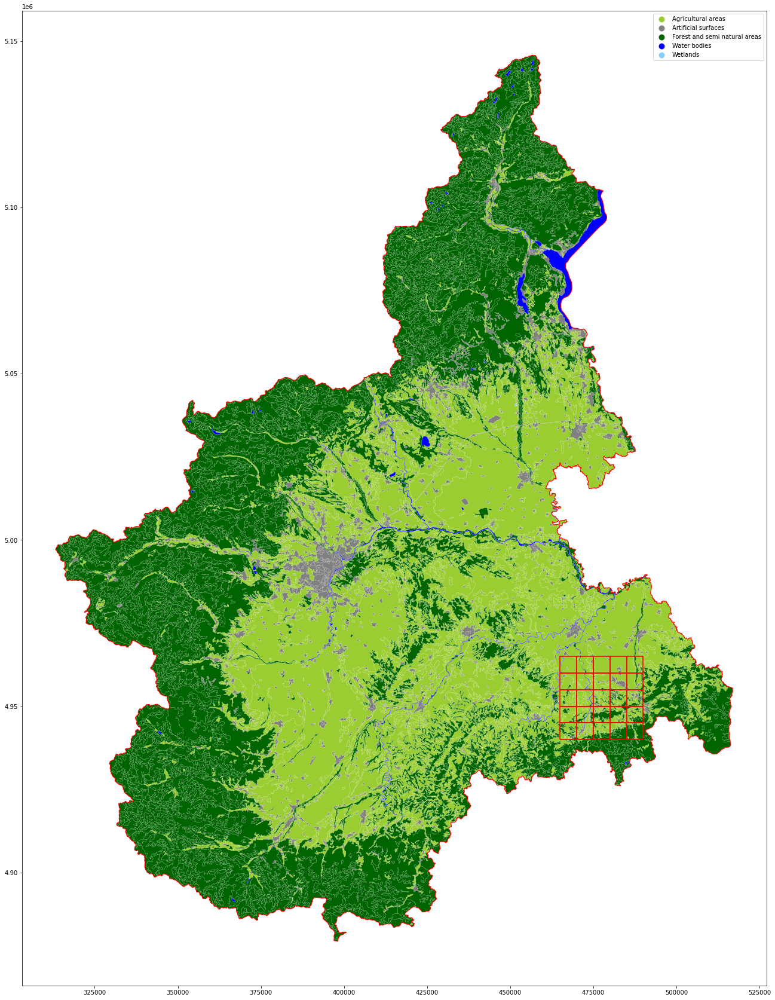

In [21]:
cmap = ListedColormap([
    "yellowgreen",
    "grey",
    "darkgreen",
    "blue",
    "lightskyblue",
])

ax = CLC2018_join.plot(column='LABEL1', figsize=(30, 30), linewidth=0.1, edgecolor='white', cmap=cmap, 
                       legend=True, zorder=1 
                      )

ay = country.plot(ax=ax, edgecolor='red', facecolor='None', linewidth=1.2, zorder=2)
az = selected_cells.plot(ax=ax, facecolor='None', linewidth=1.6, edgecolor='red', zorder=3)

In [22]:
CLC2018_cells_clip = gpd.clip(CLC2018_join, selected_cells)

/Users/magio94/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [23]:
CLC2018_cells_clip.to_file('Training/CLC2018_cells_clip.shp')

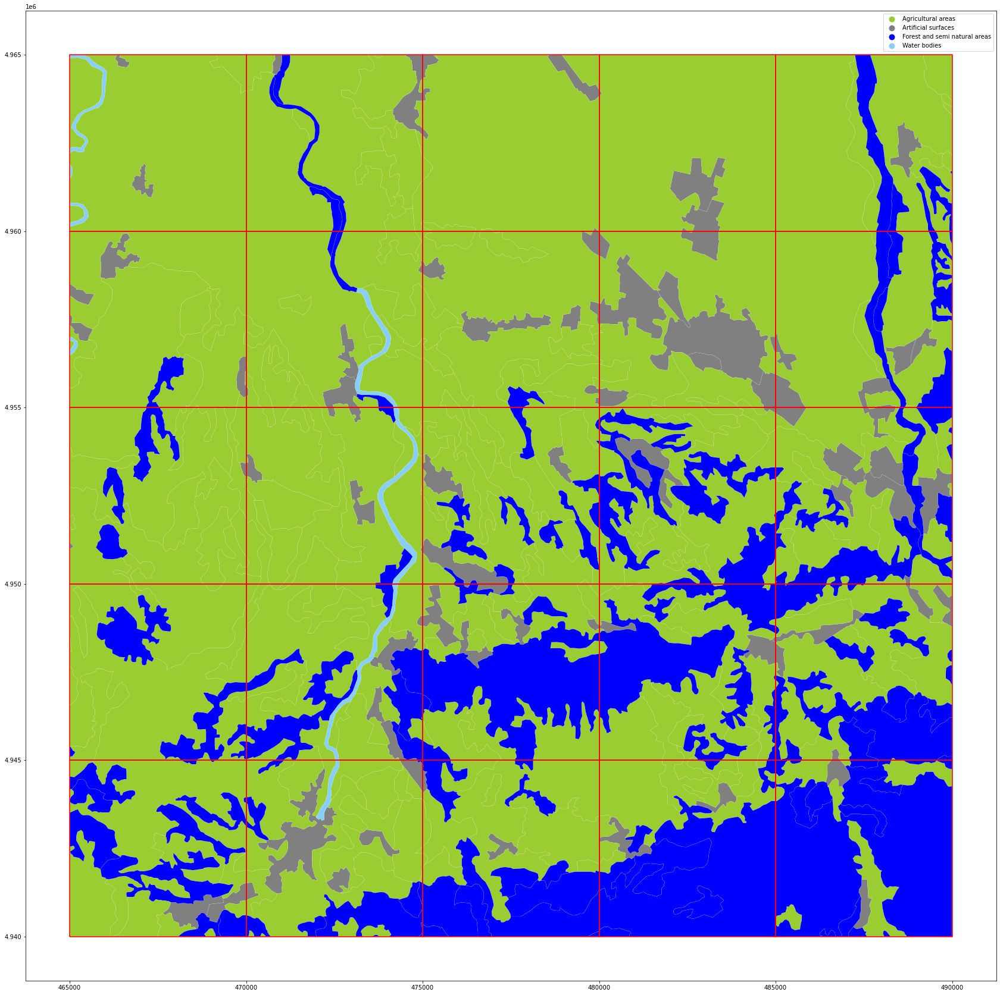

In [24]:
cmap = ListedColormap([
    "yellowgreen",
    "grey",
    "darkgreen",
    "blue",
    "lightskyblue",
])

ax = CLC2018_cells_clip.plot(column='LABEL1', figsize=(30, 30), linewidth=0.1, edgecolor='white', cmap=cmap, 
                       legend=True, zorder=1 
                      )
az = selected_cells.plot(ax=ax, facecolor='None', linewidth=1.6, edgecolor='red', zorder=2)

# CALLING SENTINEL 2

In [ ]:
January2020_imagePath = 'GIS/Satellite images/S2A_MSIL2A_20200112T102401_N0213_R065_T32TMQ_20200112T115112.SAFE/GRANULE/L2A_T32TMQ_A023800_20200112T102409/IMG_DATA/R10m/'
February2021_imagePath = 'GIS/Satellite images/S2A_MSIL2A_20210225T102021_N0214_R065_T32TMQ_20210225T131230.SAFE/GRANULE/L2A_T32TMQ_A029663_20210225T102740/IMG_DATA/R10m/'
March_2021imagePath = 'GIS/Satellite images/S2B_MSIL2A_20210302T101839_N0214_R065_T32TMQ_20210302T130805.SAFE/GRANULE/L2A_T32TMQ_A020826_20210302T101835/IMG_DATA/R10m/'
April2020_imagePath = 'GIS/Satellite images/S2A_MSIL2A_20200411T102021_N0214_R065_T32TMQ_20200411T143032.SAFE/GRANULE/L2A_T32TMQ_A025087_20200411T102438/IMG_DATA/R10m/'
May2020_imagePath = 'GIS/Satellite images/S2A_MSIL2A_20200521T102031_N0214_R065_T32TMQ_20200521T131814.SAFE/GRANULE/L2A_T32TMQ_A025659_20200521T102644/IMG_DATA/R10m/'
July_2020imagePath = 'GIS/Satellite images/S2B_MSIL2A_20200725T101559_N0214_R065_T32TMQ_20200725T135708.SAFE/GRANULE/L2A_T32TMQ_A017680_20200725T102124/IMG_DATA/R10m/'
June2020_imagePath = 'GIS/Satellite images/S2A_MSIL2A_20200620T102031_N0214_R065_T32TMQ_20200620T131229.SAFE/GRANULE/L2A_T32TMQ_A026088_20200620T102641/IMG_DATA/R10m/'
August2020_imagePath = 'GIS/Satellite images/S2A_MSIL2A_20200809T102031_N0214_R065_T32TMQ_20200809T130506.SAFE/GRANULE/L2A_T32TMQ_A026803_20200809T102029/IMG_DATA/R10m/'
September2020_imagePath = 'GIS/Satellite images/S2A_MSIL2A_20200918T102031_N0214_R065_T32TMQ_20200918T131806.SAFE/GRANULE/L2A_T32TMQ_A027375_20200918T102719/IMG_DATA/R10m/'
October_2020imagePath = 'GIS/Satellite images/S2A_MSIL2A_20201008T102031_N0214_R065_T32TMQ_20201008T131321.SAFE/GRANULE/L2A_T32TMQ_A027661_20201008T102029/IMG_DATA/R10m/'
November_2020imagePath = 'GIS/Satellite images/S2A_MSIL2A_20201028T102141_N0214_R065_T32TMQ_20201028T130823.SAFE/GRANULE/L2A_T32TMQ_A027947_20201028T102748/IMG_DATA/R10m/'
December_2019imagePath = 'GIS/Satellite images/S2A_MSIL2A_20191223T102431_N0213_R065_T32TMQ_20191223T120210.SAFE/GRANULE/L2A_T32TMQ_A023514_20191223T102430/IMG_DATA/R10m/'

In [ ]:
# read bands by month

# January2020 bands
January2020_band2 = rasterio.open(January2020_imagePath+'T32TMQ_20200112T102401_B02_10m.jp2', driver='JP2OpenJPEG')
January2020_band3 = rasterio.open(January2020_imagePath+'T32TMQ_20200112T102401_B03_10m.jp2', driver='JP2OpenJPEG')
January2020_band4 = rasterio.open(January2020_imagePath+'T32TMQ_20200112T102401_B04_10m.jp2', driver='JP2OpenJPEG')
January2020_band8 = rasterio.open(January2020_imagePath+'T32TMQ_20200112T102401_B08_10m.jp2', driver='JP2OpenJPEG')

# February2021 bands
February2021_band2 = rasterio.open(February2021_imagePath+'T32TMQ_20210225T102021_B02_10m.jp2', driver='JP2OpenJPEG')
February2021_band3 = rasterio.open(February2021_imagePath+'T32TMQ_20210225T102021_B03_10m.jp2', driver='JP2OpenJPEG')
February2021_band4 = rasterio.open(February2021_imagePath+'T32TMQ_20210225T102021_B04_10m.jp2', driver='JP2OpenJPEG')
February2021_band8 = rasterio.open(February2021_imagePath+'T32TMQ_20210225T102021_B08_10m.jp2', driver='JP2OpenJPEG')

# March_2021 bands
March_2021_band2 = rasterio.open(March_2021imagePath+'T32TMQ_20210302T101839_B02_10m.jp2', driver='JP2OpenJPEG')
March_2021_band3 = rasterio.open(March_2021imagePath+'T32TMQ_20210302T101839_B03_10m.jp2', driver='JP2OpenJPEG')
March_2021_band4 = rasterio.open(March_2021imagePath+'T32TMQ_20210302T101839_B04_10m.jp2', driver='JP2OpenJPEG')
March_2021_band8 = rasterio.open(March_2021imagePath+'T32TMQ_20210302T101839_B08_10m.jp2', driver='JP2OpenJPEG')

# April2020 bands
April2020_band2 = rasterio.open(April2020_imagePath+'T32TMQ_20200411T102021_B02_10m.jp2', driver='JP2OpenJPEG')
April2020_band3 = rasterio.open(April2020_imagePath+'T32TMQ_20200411T102021_B03_10m.jp2', driver='JP2OpenJPEG')
April2020_band4 = rasterio.open(April2020_imagePath+'T32TMQ_20200411T102021_B04_10m.jp2', driver='JP2OpenJPEG')
April2020_band8 = rasterio.open(April2020_imagePath+'T32TMQ_20200411T102021_B08_10m.jp2', driver='JP2OpenJPEG')

# May2020 bands
May2020_band2 = rasterio.open(May2020_imagePath+'T32TMQ_20200521T102031_B02_10m.jp2', driver='JP2OpenJPEG')
May2020_band3 = rasterio.open(May2020_imagePath+'T32TMQ_20200521T102031_B03_10m.jp2', driver='JP2OpenJPEG')
May2020_band4 = rasterio.open(May2020_imagePath+'T32TMQ_20200521T102031_B04_10m.jp2', driver='JP2OpenJPEG')
May2020_band8 = rasterio.open(May2020_imagePath+'T32TMQ_20200521T102031_B08_10m.jp2', driver='JP2OpenJPEG')

# July_2020 bands
July_2020_band2 = rasterio.open(July_2020imagePath+'T32TMQ_20200725T101559_B02_10m.jp2', driver='JP2OpenJPEG')
July_2020_band3 = rasterio.open(July_2020imagePath+'T32TMQ_20200725T101559_B03_10m.jp2', driver='JP2OpenJPEG')
July_2020_band4 = rasterio.open(July_2020imagePath+'T32TMQ_20200725T101559_B04_10m.jp2', driver='JP2OpenJPEG')
July_2020_band8 = rasterio.open(July_2020imagePath+'T32TMQ_20200725T101559_B08_10m.jp2', driver='JP2OpenJPEG')

# June2020 bands
June2020_band2 = rasterio.open(June2020_imagePath+'T32TMQ_20200620T102031_B02_10m.jp2', driver='JP2OpenJPEG')
June2020_band3 = rasterio.open(June2020_imagePath+'T32TMQ_20200620T102031_B03_10m.jp2', driver='JP2OpenJPEG')
June2020_band4 = rasterio.open(June2020_imagePath+'T32TMQ_20200620T102031_B04_10m.jp2', driver='JP2OpenJPEG')
June2020_band8 = rasterio.open(June2020_imagePath+'T32TMQ_20200620T102031_B08_10m.jp2', driver='JP2OpenJPEG')

# August2020 bands
August2020_band2 = rasterio.open(August2020_imagePath+'T32TMQ_20200809T102031_B02_10m.jp2', driver='JP2OpenJPEG')
August2020_band3 = rasterio.open(August2020_imagePath+'T32TMQ_20200809T102031_B03_10m.jp2', driver='JP2OpenJPEG')
August2020_band4 = rasterio.open(August2020_imagePath+'T32TMQ_20200809T102031_B04_10m.jp2', driver='JP2OpenJPEG')
August2020_band8 = rasterio.open(August2020_imagePath+'T32TMQ_20200809T102031_B08_10m.jp2', driver='JP2OpenJPEG')

# September2020 bands
September2020_band2 = rasterio.open(September2020_imagePath+'T32TMQ_20200918T102031_B02_10m.jp2', driver='JP2OpenJPEG')
September2020_band3 = rasterio.open(September2020_imagePath+'T32TMQ_20200918T102031_B03_10m.jp2', driver='JP2OpenJPEG')
September2020_band4 = rasterio.open(September2020_imagePath+'T32TMQ_20200918T102031_B04_10m.jp2', driver='JP2OpenJPEG')
September2020_band8 = rasterio.open(September2020_imagePath+'T32TMQ_20200918T102031_B08_10m.jp2', driver='JP2OpenJPEG')

# October2020 bands
October_2020_band2 = rasterio.open(October_2020imagePath+'T32TMQ_20201008T102031_B02_10m.jp2', driver='JP2OpenJPEG')
October_2020_band3 = rasterio.open(October_2020imagePath+'T32TMQ_20201008T102031_B03_10m.jp2', driver='JP2OpenJPEG')
October_2020_band4 = rasterio.open(October_2020imagePath+'T32TMQ_20201008T102031_B04_10m.jp2', driver='JP2OpenJPEG')
October_2020_band8 = rasterio.open(October_2020imagePath+'T32TMQ_20201008T102031_B08_10m.jp2', driver='JP2OpenJPEG')

# November_2020 bands
November_2020_band2 = rasterio.open(November_2020imagePath+'T32TMQ_20201028T102141_B02_10m.jp2', driver='JP2OpenJPEG')
November_2020_band3 = rasterio.open(November_2020imagePath+'T32TMQ_20201028T102141_B03_10m.jp2', driver='JP2OpenJPEG')
November_2020_band4 = rasterio.open(November_2020imagePath+'T32TMQ_20201028T102141_B04_10m.jp2', driver='JP2OpenJPEG')
November_2020_band8 = rasterio.open(November_2020imagePath+'T32TMQ_20201028T102141_B08_10m.jp2', driver='JP2OpenJPEG')

# December_2019 bands
December_2019_band2 = rasterio.open(December_2019imagePath+'T32TMQ_20191223T102431_B02_10m.jp2', driver='JP2OpenJPEG')
December_2019_band3 = rasterio.open(December_2019imagePath+'T32TMQ_20191223T102431_B03_10m.jp2', driver='JP2OpenJPEG')
December_2019_band4 = rasterio.open(December_2019imagePath+'T32TMQ_20191223T102431_B04_10m.jp2', driver='JP2OpenJPEG')
December_2019_band8 = rasterio.open(December_2019imagePath+'T32TMQ_20191223T102431_B08_10m.jp2', driver='JP2OpenJPEG')

### Plot True color image

In [ ]:
rgb = rasterio.open(January2020_imagePath+'T32TMQ_20200112T102401_TCI_10m.jp2', driver='JP2OpenJPEG') #RGB

In [ ]:
fig, ax = plt.subplots(figsize=(15, 15))
show(rgb.read(), transform=rgb.transform, ax=ax)
ay = country.plot(ax=ax, edgecolor='red', facecolor='None', linewidth=1.2, zorder=2)
az = selected_cells.plot(ax=ax, facecolor='None', linewidth=1.6, edgecolor='red', zorder=3)

In [ ]:
# Read Shape file
with fiona.open('Training/selection_grid.shp', 'r') as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

# read imagery file
with rasterio.open(January2020_imagePath+'T32TMQ_20200112T102401_TCI_10m.jp2') as src:
    out_image, out_transform = rasterio.mask.mask(src, shapes, crop=True)
    out_meta = src.meta

# Save clipped imagery
out_meta.update({"driver": "GTiff",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})

with rasterio.open("GIS/Satellite images/clip.tiff", "w", **out_meta) as dest:
    dest.write(out_image)

In [ ]:
rgb = rasterio.open('GIS/Satellite images/clip.tiff') #RGB

In [ ]:
fig, ax = plt.subplots(figsize=(15, 15))
show(rgb.read(), transform=rgb.transform, ax=ax)
az = selected_cells.plot(ax=ax, facecolor='None', linewidth=0.6, edgecolor='red')

In [ ]:
def ndvi_function(band4, band8):
    np.seterr(divide='ignore', invalid='ignore')
    red = band4.read(1).astype('float64')
    nir = band8.read(1).astype('float64')
    ndvi = np.where(
    (nir+red)==0.,
    0,
    (nir-red)/(nir+red)
    )
    return ndvi

In [ ]:
ndvi_January2020 = ndvi_function(January2020_band4, January2020_band8)
ndvi_February2021 = ndvi_function(February2021_band4, February2021_band8)
ndvi_March_2021 = ndvi_function(March_2021_band4, March_2021_band8)
ndvi_April2020 = ndvi_function(April2020_band4, April2020_band8)
ndvi_May2020 = ndvi_function(May2020_band4, May2020_band8)
ndvi_June2020 = ndvi_function(June2020_band4, June2020_band8)
ndvi_July2020 = ndvi_function(July_2020_band4, July_2020_band8)
ndvi_August2020 = ndvi_function(August2020_band4, August2020_band8)
ndvi_September2020 = ndvi_function(September2020_band4, September2020_band8)
ndvi_October_2020 = ndvi_function(October_2020_band4, October_2020_band8)
ndvi_November_2020 = ndvi_function(November_2020_band4, November_2020_band8)
ndvi_December_2019 = ndvi_function(December_2019_band4, December_2019_band8)

In [ ]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30,30))
plot.show(ndvi_January2020, ax=ax1, cmap='RdYlGn')
plot.show(ndvi_February2021, ax=ax2, cmap='RdYlGn') 
plot.show(ndvi_March_2021, ax=ax3, cmap='RdYlGn') 
plot.show(ndvi_April2020, ax=ax4, cmap='RdYlGn')

fig.tight_layout()

In [ ]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30,30))
plot.show(ndvi_May2020, ax=ax1, cmap='RdYlGn')
plot.show(ndvi_July2020, ax=ax2, cmap='RdYlGn')
plot.show(ndvi_June2020, ax=ax3, cmap='RdYlGn') 
plot.show(ndvi_August2020, ax=ax4, cmap='RdYlGn')

fig.tight_layout()

In [ ]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30,30))
plot.show(ndvi_September2020, ax=ax1, cmap='RdYlGn') 
plot.show(ndvi_October_2020, ax=ax2, cmap='RdYlGn')
plot.show(ndvi_November_2020, ax=ax3, cmap='RdYlGn')
plot.show(ndvi_December_2019, ax=ax4, cmap='RdYlGn') 

fig.tight_layout()

### First method NDVI

In [ ]:
ndvi_mean = (ndvi_January2020 + ndvi_February2021 + ndvi_March_2021 + ndvi_April2020 + ndvi_May2020 + 
             ndvi_June2020 + ndvi_July2020 + ndvi_August2020 + ndvi_September2020 + ndvi_October_2020 +
             ndvi_November_2020 + ndvi_December_2019
            )/12

In [ ]:
# save ndvi_mean

ndviImage = rasterio.open('GIS/Satellite images/ndvi_mean.tiff', 'w', driver ='Gtiff',
                         width=January2020_band2.width, height = January2020_band2.height,
                          count=1,
                          crs=January2020_band2.crs,
                          transform=January2020_band2.transform,
                          dtype='float64'
                         )

ndviImage.write(ndvi_mean, 1)
ndviImage.close()

In [ ]:
# Read Shape file
with fiona.open('Training/selection_grid.shp', 'r') as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

# read imagery file
with rasterio.open('GIS/Satellite images/ndvi_mean.tiff') as src:
    out_image, out_transform = rasterio.mask.mask(src, shapes, crop=True)
    out_meta = src.meta

# Save clipped imagery
out_meta.update({"driver": "GTiff",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})

with rasterio.open("GIS/Satellite images/ndvi_clip.tiff", "w", **out_meta) as dest:
    dest.write(out_image)

In [ ]:
rgb = rasterio.open('GIS/Satellite images/ndvi_clip.tiff') 

In [ ]:
fig, ax = plt.subplots(figsize=(15, 15))
show(rgb.read(), transform=rgb.transform, cmap='RdYlGn', ax=ax)
az = selected_cells.plot(ax=ax, facecolor='None', linewidth=0.9, edgecolor='black')

In [ ]:
# Create classes and apply to NDVI results
ndvi_class_bins = [-np.inf, 0, 0.1, 0.25, 0.4, np.inf]
ndvi_landsat_class = np.digitize(rgb.read(1), ndvi_class_bins)

# Apply the nodata mask to the newly classified NDVI data
ndvi_landsat_class = np.ma.masked_where(
    np.ma.getmask(rgb), ndvi_landsat_class
)
np.unique(ndvi_landsat_class)

# Define color map
nbr_colors = ["gray", "y", "yellowgreen", "g", "darkgreen"]
nbr_cmap = ListedColormap(nbr_colors)

# Define class names
ndvi_cat_names = [
    "No Vegetation",
    "Bare Area",
    "Low Vegetation",
    "Moderate Vegetation",
    "High Vegetation",
]

# Get list of classes
classes = np.unique(ndvi_landsat_class)
classes = classes.tolist()
# The mask returns a value of none in the classes. remove that
classes = classes[0:5]

# Plot your data
fig, ax = plt.subplots(figsize=(12, 12))
im = ax.imshow(ndvi_landsat_class, cmap=nbr_cmap)
#az = selected_cells.plot(ax=ax, facecolor='None', linewidth=0.9, edgecolor='black')

ep.draw_legend(im_ax=im, classes=classes, titles=ndvi_cat_names)
ax.set_title(
    "Sentinel 2 - Normalized Difference Vegetation Index (NDVI) Classes",
    fontsize=14,
)
ax.set_axis_off()

### Second method NDVI

In [ ]:
mean_ndvi = np.mean([ndvi_January2020, ndvi_February2021, ndvi_March_2021, ndvi_April2020, ndvi_May2020,
                     ndvi_June2020, ndvi_July2020, ndvi_August2020, ndvi_September2020, ndvi_October_2020,
                     ndvi_November_2020, ndvi_December_2019], axis =0)

In [ ]:
# save ndvi_mean

ndviImage = rasterio.open('GIS/Satellite images/ndvi_mean2.tiff', 'w', driver ='Gtiff',
                         width=January2020_band2.width, height = January2020_band2.height,
                          count=1,
                          crs=January2020_band2.crs,
                          transform=January2020_band2.transform,
                          dtype='float64'
                         )

ndviImage.write(mean_ndvi, 1)
ndviImage.close()

In [ ]:
# Read Shape file
with fiona.open('Training/selection_grid.shp', 'r') as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

# read imagery file
with rasterio.open('GIS/Satellite images/ndvi_mean2.tiff') as src:
    out_image, out_transform = rasterio.mask.mask(src, shapes, crop=True)
    out_meta = src.meta

# Save clipped imagery
out_meta.update({"driver": "GTiff",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})

with rasterio.open("GIS/Satellite images/ndvi_clip2.tiff", "w", **out_meta) as dest:
    dest.write(out_image)

In [ ]:
rgb = rasterio.open('GIS/Satellite images/ndvi_clip2.tiff')

In [ ]:
print('\nMax NDVI: {m}'.format(m=rgb.read(1).max()))
print('Mean NDVI: {m}'.format(m=rgb.read(1).mean()))
print('Median NDVI: {m}'.format(m=np.median(rgb.read(1))))
print('Min NDVI: {m}'.format(m=rgb.read(1).min()))

In [ ]:
fig, ax = plt.subplots(figsize=(30, 30))

ay = show(rgb.read(), transform=rgb.transform, cmap='RdYlGn', ax=ax)
az = selected_cells.plot(ax=ax, facecolor='None', linewidth=0.9, edgecolor='black')

fig.subplots_adjust(bottom=0.25)
norm = mpl.colors.Normalize(vmin=rgb.read().min(), vmax=rgb.read().max())
cmap = plt.cm.RdYlGn
barcolors = plt.cm.ScalarMappable(norm, cmap)

cb1 = mpl.colorbar.ColorbarBase(ax1, cmap=mpl.cm.RdYlGn,
                               norm=norm,
                               orientation='horizontal')

In [ ]:
fig, ax = plt.subplots(figsize=(30, 30))

ay = show(rgb.read(), transform=rgb.transform, cmap='RdYlGn', ax=ax)
az = selected_cells.plot(ax=ax, facecolor='None', linewidth=0.9, edgecolor='black')

fig.subplots_adjust(bottom=0.15)
norm = mpl.colors.Normalize(vmin=rgb.read().min(), vmax=rgb.read().max())
cmap = plt.cm.RdYlGn
barcolors = plt.cm.ScalarMappable(norm, cmap)
ax1 = fig.add_axes([0.05, 0.10, 0.9, 0.02])
ax1.tick_params(labelsize=20) 
cb1 = mpl.colorbar.ColorbarBase(ax1, cmap=mpl.cm.RdYlGn,
                               norm=norm,
                               orientation='horizontal')

In [ ]:
shapefile_grid = gpd.read_file('Training/selection_grid.shp')
rgb = rasterio.open('GIS/Satellite images/ndvi_clip2.tiff')
rgb = rgb.read()
titles = ["Sentinel 2 - Normalized Difference Vegetation Index (NDVI)"]

fig, ax = plt.subplots(figsize=(15, 15))
ep.plot_bands(rgb, cmap="RdYlGn", cols=1, title=titles, ax=ax)

### Standard deviation NDVI

In [ ]:
std_ndvi = np.std([ndvi_January2020, ndvi_February2021, ndvi_March_2021, ndvi_April2020, ndvi_May2020,
                     ndvi_June2020, ndvi_July2020, ndvi_August2020, ndvi_September2020, ndvi_October_2020,
                     ndvi_November_2020, ndvi_December_2019], axis =0)

In [ ]:
# save ndvi_mean

stdImage = rasterio.open('GIS/Satellite images/std_ndvi.tiff', 'w', driver ='Gtiff',
                         width=January2020_band2.width, height = January2020_band2.height,
                         count=1,
                         crs=January2020_band2.crs,
                         transform=January2020_band2.transform,
                         dtype='float64'
                        )

stdImage.write(std_ndvi, 1)
stdImage.close()

In [ ]:
# Read Shape file
with fiona.open('Training/selection_grid.shp', 'r') as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

# read imagery file
with rasterio.open('GIS/Satellite images/std_ndvi.tiff') as src:
    out_image, out_transform = rasterio.mask.mask(src, shapes, crop=True)
    out_meta = src.meta

# Save clipped imagery
out_meta.update({"driver": "GTiff",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})

with rasterio.open("GIS/Satellite images/std_ndvi_clip.tiff", "w", **out_meta) as dest:
    dest.write(out_image)

In [ ]:
rgb = rasterio.open('GIS/Satellite images/std_ndvi_clip.tiff')

In [ ]:
print('\nMax NDVI: {m}'.format(m=rgb.read(1).max()))
print('Mean NDVI: {m}'.format(m=rgb.read(1).mean()))
print('Median NDVI: {m}'.format(m=np.median(rgb.read(1))))
print('Min NDVI: {m}'.format(m=rgb.read(1).min()))

In [ ]:
cmap_r = matplotlib.cm.get_cmap('RdYlGn')

fig, ax = plt.subplots(figsize=(15, 15))
show(rgb, cmap=cmap_r, ax=ax)
az = selected_cells.plot(ax=ax, facecolor='None', linewidth=0.9, edgecolor='black')

### Calculating NDWI

In [ ]:
def ndwi_function(band3, band8):
    np.seterr(divide='ignore', invalid='ignore')
    green = band3.read(1).astype('float64')
    nir = band8.read(1).astype('float64')
    ndwi = np.where(
    (green + nir)==0.,
    0,
    (green - nir)/(green + nir)
    )
    return ndwi

In [ ]:
ndwi_January2020 = ndwi_function(January2020_band3, January2020_band8)
ndwi_February2021 = ndwi_function(February2021_band3, February2021_band8)
ndwi_March_2021 = ndwi_function(March_2021_band3, March_2021_band8)
ndwi_April2020 = ndwi_function(April2020_band3, April2020_band8)
ndwi_May2020 = ndwi_function(May2020_band3, May2020_band8)
ndwi_June2020 = ndwi_function(June2020_band3, June2020_band8)
ndwi_July2020 = ndwi_function(July_2020_band3, July_2020_band8)
ndwi_August2020 = ndwi_function(August2020_band3, August2020_band8)
ndwi_September2020 = ndwi_function(September2020_band3, September2020_band8)
ndwi_October_2020 = ndwi_function(October_2020_band3, October_2020_band8)
ndwi_November_2020 = ndwi_function(November_2020_band3, November_2020_band8)
ndwi_December_2019 = ndwi_function(December_2019_band3, December_2019_band8)

In [ ]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30,30))
plot.show(ndwi_January2020, ax=ax1, cmap='jet_r')
plot.show(ndwi_February2021, ax=ax2, cmap='jet_r') 
plot.show(ndwi_March_2021, ax=ax3, cmap='jet_r') 
plot.show(ndwi_April2020, ax=ax4, cmap='jet_r')

fig.tight_layout()

In [ ]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30,30))
plot.show(ndwi_May2020, ax=ax1, cmap='jet_r')
plot.show(ndwi_June2020, ax=ax2, cmap='jet_r') 
plot.show(ndwi_July2020, ax=ax3, cmap='jet_r') 
plot.show(ndwi_August2020, ax=ax4, cmap='jet_r')

fig.tight_layout()

In [ ]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30,30))
plot.show(ndwi_September2020, ax=ax1, cmap='jet_r')
plot.show(ndwi_October_2020, ax=ax2, cmap='jet_r') 
plot.show(ndwi_November_2020, ax=ax3, cmap='jet_r') 
plot.show(ndwi_December_2019, ax=ax4, cmap='jet_r')

fig.tight_layout()

### NDWI mean

In [ ]:
mean_ndwi = np.mean([ndwi_January2020, ndwi_February2021, ndwi_March_2021, ndwi_April2020, ndwi_May2020,
                     ndwi_June2020, ndwi_July2020, ndwi_August2020, ndwi_September2020, ndwi_October_2020,
                     ndwi_November_2020, ndwi_December_2019], axis =0)

In [ ]:
# save ndvi_mean

stdImage = rasterio.open('GIS/Satellite images/mean_ndwi.tiff', 'w', driver ='Gtiff',
                         width=January2020_band2.width, height = January2020_band2.height,
                         count=1,
                         crs=January2020_band2.crs,
                         transform=January2020_band2.transform,
                         dtype='float64'
                        )

stdImage.write(mean_ndwi, 1)
stdImage.close()

In [ ]:
# Read Shape file
with fiona.open('Training/selection_grid.shp', 'r') as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

# read imagery file
with rasterio.open('GIS/Satellite images/mean_ndwi.tiff') as src:
    out_image, out_transform = rasterio.mask.mask(src, shapes, crop=True)
    out_meta = src.meta

# Save clipped imagery
out_meta.update({"driver": "GTiff",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})

with rasterio.open("GIS/Satellite images/mean_ndwi_clip.tiff", "w", **out_meta) as dest:
    dest.write(out_image)

In [ ]:
rgb = rasterio.open('GIS/Satellite images/mean_ndwi_clip.tiff')

In [ ]:
print('\nMax NDVI: {m}'.format(m=rgb.read(1).max()))
print('Mean NDVI: {m}'.format(m=rgb.read(1).mean()))
print('Median NDVI: {m}'.format(m=np.median(rgb.read(1))))
print('Min NDVI: {m}'.format(m=rgb.read(1).min()))

In [ ]:
fig, ax = plt.subplots(figsize=(15, 15))
show(rgb, cmap='jet_r', ax=ax)
az = selected_cells.plot(ax=ax, facecolor='None', linewidth=0.9, edgecolor='black')

### NDWI std

In [ ]:
std_ndwi = np.std([ndwi_January2020, ndwi_February2021, ndwi_March_2021, ndwi_April2020, ndwi_May2020,
                     ndwi_June2020, ndwi_July2020, ndwi_August2020, ndwi_September2020, ndwi_October_2020,
                     ndwi_November_2020, ndwi_December_2019], axis =0)

In [ ]:
# save ndvi_mean

stdImage = rasterio.open('GIS/Satellite images/std_ndwi.tiff', 'w', driver ='Gtiff',
                         width=January2020_band2.width, height = January2020_band2.height,
                         count=1,
                         crs=January2020_band2.crs,
                         transform=January2020_band2.transform,
                         dtype='float64'
                        )

stdImage.write(std_ndwi, 1)
stdImage.close()

In [ ]:
# Read Shape file
with fiona.open('Training/selection_grid.shp', 'r') as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

# read imagery file
with rasterio.open('GIS/Satellite images/std_ndwi.tiff') as src:
    out_image, out_transform = rasterio.mask.mask(src, shapes, crop=True)
    out_meta = src.meta

# Save clipped imagery
out_meta.update({"driver": "GTiff",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})

with rasterio.open("GIS/Satellite images/std_ndwi_clip.tiff", "w", **out_meta) as dest:
    dest.write(out_image)

In [ ]:
rgb = rasterio.open('GIS/Satellite images/std_ndwi_clip.tiff')

In [ ]:
print('\nMax NDVI: {m}'.format(m=rgb.read(1).max()))
print('Mean NDVI: {m}'.format(m=rgb.read(1).mean()))
print('Median NDVI: {m}'.format(m=np.median(rgb.read(1))))
print('Min NDVI: {m}'.format(m=rgb.read(1).min()))

In [ ]:
fig, ax = plt.subplots(figsize=(15, 15))
show(rgb, cmap='jet_r', ax=ax)
az = selected_cells.plot(ax=ax, facecolor='None', linewidth=0.9, edgecolor='black')

### Calculating NDBI

In [ ]:
January2020_imagePath_20m = 'GIS/Satellite images/S2A_MSIL2A_20200112T102401_N0213_R065_T32TMQ_20200112T115112.SAFE/GRANULE/L2A_T32TMQ_A023800_20200112T102409/IMG_DATA/R20m/'
February2021_imagePath_20m = 'GIS/Satellite images/S2A_MSIL2A_20210225T102021_N0214_R065_T32TMQ_20210225T131230.SAFE/GRANULE/L2A_T32TMQ_A029663_20210225T102740/IMG_DATA/R20m/'
March_2021imagePath_20m = 'GIS/Satellite images/S2B_MSIL2A_20210302T101839_N0214_R065_T32TMQ_20210302T130805.SAFE/GRANULE/L2A_T32TMQ_A020826_20210302T101835/IMG_DATA/R20m/'
April2020_imagePath_20m = 'GIS/Satellite images/S2A_MSIL2A_20200411T102021_N0214_R065_T32TMQ_20200411T143032.SAFE/GRANULE/L2A_T32TMQ_A025087_20200411T102438/IMG_DATA/R20m/'
May2020_imagePath_20m = 'GIS/Satellite images/S2A_MSIL2A_20200521T102031_N0214_R065_T32TMQ_20200521T131814.SAFE/GRANULE/L2A_T32TMQ_A025659_20200521T102644/IMG_DATA/R20m/'
July_2020imagePath_20m = 'GIS/Satellite images/S2B_MSIL2A_20200725T101559_N0214_R065_T32TMQ_20200725T135708.SAFE/GRANULE/L2A_T32TMQ_A017680_20200725T102124/IMG_DATA/R20m/'
June2020_imagePath_20m = 'GIS/Satellite images/S2A_MSIL2A_20200620T102031_N0214_R065_T32TMQ_20200620T131229.SAFE/GRANULE/L2A_T32TMQ_A026088_20200620T102641/IMG_DATA/R20m/'
August2020_imagePath_20m = 'GIS/Satellite images/S2A_MSIL2A_20200809T102031_N0214_R065_T32TMQ_20200809T130506.SAFE/GRANULE/L2A_T32TMQ_A026803_20200809T102029/IMG_DATA/R20m/'
September2020_imagePath_20m = 'GIS/Satellite images/S2A_MSIL2A_20200918T102031_N0214_R065_T32TMQ_20200918T131806.SAFE/GRANULE/L2A_T32TMQ_A027375_20200918T102719/IMG_DATA/R20m/'
October_2020imagePath_20m = 'GIS/Satellite images/S2A_MSIL2A_20201008T102031_N0214_R065_T32TMQ_20201008T131321.SAFE/GRANULE/L2A_T32TMQ_A027661_20201008T102029/IMG_DATA/R20m/'
November_2020imagePath_20m = 'GIS/Satellite images/S2A_MSIL2A_20201028T102141_N0214_R065_T32TMQ_20201028T130823.SAFE/GRANULE/L2A_T32TMQ_A027947_20201028T102748/IMG_DATA/R20m/'
December_2019imagePath_20m = 'GIS/Satellite images/S2A_MSIL2A_20191223T102431_N0213_R065_T32TMQ_20191223T120210.SAFE/GRANULE/L2A_T32TMQ_A023514_20191223T102430/IMG_DATA/R20m/'

In [ ]:
# read bands by month

# January2020 bands
January2020_band2_20 = rasterio.open(January2020_imagePath_20m+'T32TMQ_20200112T102401_B02_20m.jp2', driver='JP2OpenJPEG')
January2020_band3_20 = rasterio.open(January2020_imagePath_20m+'T32TMQ_20200112T102401_B03_20m.jp2', driver='JP2OpenJPEG')
January2020_band4_20 = rasterio.open(January2020_imagePath_20m+'T32TMQ_20200112T102401_B04_20m.jp2', driver='JP2OpenJPEG')
January2020_band11_20 = rasterio.open(January2020_imagePath_20m+'T32TMQ_20200112T102401_B11_20m.jp2', driver='JP2OpenJPEG')

# February2021 bands
February2021_band2_20 = rasterio.open(February2021_imagePath_20m+'T32TMQ_20210225T102021_B02_20m.jp2', driver='JP2OpenJPEG')
February2021_band3_20 = rasterio.open(February2021_imagePath_20m+'T32TMQ_20210225T102021_B03_20m.jp2', driver='JP2OpenJPEG')
February2021_band4_20 = rasterio.open(February2021_imagePath_20m+'T32TMQ_20210225T102021_B04_20m.jp2', driver='JP2OpenJPEG')
February2021_band11_20 = rasterio.open(February2021_imagePath_20m+'T32TMQ_20210225T102021_B11_20m.jp2', driver='JP2OpenJPEG')

# March_2021 bands
March_2021_band2_20 = rasterio.open(March_2021imagePath_20m+'T32TMQ_20210302T101839_B02_20m.jp2', driver='JP2OpenJPEG')
March_2021_band3_20 = rasterio.open(March_2021imagePath_20m+'T32TMQ_20210302T101839_B03_20m.jp2', driver='JP2OpenJPEG')
March_2021_band4_20 = rasterio.open(March_2021imagePath_20m+'T32TMQ_20210302T101839_B04_20m.jp2', driver='JP2OpenJPEG')
March_2021_band11_20 = rasterio.open(March_2021imagePath_20m+'T32TMQ_20210302T101839_B11_20m.jp2', driver='JP2OpenJPEG')

# April2020 bands
April2020_band2_20 = rasterio.open(April2020_imagePath_20m+'T32TMQ_20200411T102021_B02_20m.jp2', driver='JP2OpenJPEG')
April2020_band3_20 = rasterio.open(April2020_imagePath_20m+'T32TMQ_20200411T102021_B03_20m.jp2', driver='JP2OpenJPEG')
April2020_band4_20 = rasterio.open(April2020_imagePath_20m+'T32TMQ_20200411T102021_B04_20m.jp2', driver='JP2OpenJPEG')
April2020_band11_20 = rasterio.open(April2020_imagePath_20m+'T32TMQ_20200411T102021_B11_20m.jp2', driver='JP2OpenJPEG')

# May2020 bands
May2020_band2_20 = rasterio.open(May2020_imagePath_20m+'T32TMQ_20200521T102031_B02_20m.jp2', driver='JP2OpenJPEG')
May2020_band3_20 = rasterio.open(May2020_imagePath_20m+'T32TMQ_20200521T102031_B03_20m.jp2', driver='JP2OpenJPEG')
May2020_band4_20 = rasterio.open(May2020_imagePath_20m+'T32TMQ_20200521T102031_B04_20m.jp2', driver='JP2OpenJPEG')
May2020_band11_20 = rasterio.open(May2020_imagePath_20m+'T32TMQ_20200521T102031_B11_20m.jp2', driver='JP2OpenJPEG')

# June2020 bands
June2020_band2_20 = rasterio.open(June2020_imagePath_20m+'T32TMQ_20200620T102031_B02_20m.jp2', driver='JP2OpenJPEG')
June2020_band3_20 = rasterio.open(June2020_imagePath_20m+'T32TMQ_20200620T102031_B03_20m.jp2', driver='JP2OpenJPEG')
June2020_band4_20 = rasterio.open(June2020_imagePath_20m+'T32TMQ_20200620T102031_B04_20m.jp2', driver='JP2OpenJPEG')
June2020_band11_20 = rasterio.open(June2020_imagePath_20m+'T32TMQ_20200620T102031_B11_20m.jp2', driver='JP2OpenJPEG')

# July_2020 bands
July_2020_band2_20 = rasterio.open(July_2020imagePath_20m+'T32TMQ_20200725T101559_B02_20m.jp2', driver='JP2OpenJPEG')
July_2020_band3_20 = rasterio.open(July_2020imagePath_20m+'T32TMQ_20200725T101559_B03_20m.jp2', driver='JP2OpenJPEG')
July_2020_band4_20 = rasterio.open(July_2020imagePath_20m+'T32TMQ_20200725T101559_B04_20m.jp2', driver='JP2OpenJPEG')
July_2020_band11_20 = rasterio.open(July_2020imagePath_20m+'T32TMQ_20200725T101559_B11_20m.jp2', driver='JP2OpenJPEG')

# August2020 bands
August2020_band2_20 = rasterio.open(August2020_imagePath_20m+'T32TMQ_20200809T102031_B02_20m.jp2', driver='JP2OpenJPEG')
August2020_band3_20 = rasterio.open(August2020_imagePath_20m+'T32TMQ_20200809T102031_B03_20m.jp2', driver='JP2OpenJPEG')
August2020_band4_20 = rasterio.open(August2020_imagePath_20m+'T32TMQ_20200809T102031_B04_20m.jp2', driver='JP2OpenJPEG')
August2020_band11_20 = rasterio.open(August2020_imagePath_20m+'T32TMQ_20200809T102031_B11_20m.jp2', driver='JP2OpenJPEG')

# September2020 bands
September2020_band2_20 = rasterio.open(September2020_imagePath_20m+'T32TMQ_20200918T102031_B02_20m.jp2', driver='JP2OpenJPEG')
September2020_band3_20 = rasterio.open(September2020_imagePath_20m+'T32TMQ_20200918T102031_B03_20m.jp2', driver='JP2OpenJPEG')
September2020_band4_20 = rasterio.open(September2020_imagePath_20m+'T32TMQ_20200918T102031_B04_20m.jp2', driver='JP2OpenJPEG')
September2020_band11_20 = rasterio.open(September2020_imagePath_20m+'T32TMQ_20200918T102031_B11_20m.jp2', driver='JP2OpenJPEG')

# October2020 bands
October_2020_band2_20 = rasterio.open(October_2020imagePath_20m+'T32TMQ_20201008T102031_B02_20m.jp2', driver='JP2OpenJPEG')
October_2020_band3_20 = rasterio.open(October_2020imagePath_20m+'T32TMQ_20201008T102031_B03_20m.jp2', driver='JP2OpenJPEG')
October_2020_band4_20 = rasterio.open(October_2020imagePath_20m+'T32TMQ_20201008T102031_B04_20m.jp2', driver='JP2OpenJPEG')
October_2020_band11_20 = rasterio.open(October_2020imagePath_20m+'T32TMQ_20201008T102031_B11_20m.jp2', driver='JP2OpenJPEG')

# November_2020 bands
November_2020_band2_20 = rasterio.open(November_2020imagePath_20m+'T32TMQ_20201028T102141_B02_20m.jp2', driver='JP2OpenJPEG')
November_2020_band3_20 = rasterio.open(November_2020imagePath_20m+'T32TMQ_20201028T102141_B03_20m.jp2', driver='JP2OpenJPEG')
November_2020_band4_20 = rasterio.open(November_2020imagePath_20m+'T32TMQ_20201028T102141_B04_20m.jp2', driver='JP2OpenJPEG')
November_2020_band11_20 = rasterio.open(November_2020imagePath_20m+'T32TMQ_20201028T102141_B11_20m.jp2', driver='JP2OpenJPEG')

# December_2019 bands
December_2019_band2_20 = rasterio.open(December_2019imagePath_20m+'T32TMQ_20191223T102431_B02_20m.jp2', driver='JP2OpenJPEG')
December_2019_band3_20 = rasterio.open(December_2019imagePath_20m+'T32TMQ_20191223T102431_B03_20m.jp2', driver='JP2OpenJPEG')
December_2019_band4_20 = rasterio.open(December_2019imagePath_20m+'T32TMQ_20191223T102431_B04_20m.jp2', driver='JP2OpenJPEG')
December_2019_band11_20 = rasterio.open(December_2019imagePath_20m+'T32TMQ_20191223T102431_B11_20m.jp2', driver='JP2OpenJPEG')

In [ ]:
January2020_band11_resampled = rasterio.open('GIS/Satellite images/saved/January2020_B11_20m_resampled.tif')
February2021_band11_resampled = rasterio.open('GIS/Satellite images/saved/February2021_B11_20m_resampled.tif')
March2021_band11_resampled = rasterio.open('GIS/Satellite images/saved/March2021_B11_20m_resampled.tif')
April2020_band11_resampled = rasterio.open('GIS/Satellite images/saved/April2020_B11_20m_resampled.tif')
May2020_band11_resampled = rasterio.open('GIS/Satellite images/saved/May2020_B11_20m_resampled.tif')
June2020_band11_resampled = rasterio.open('GIS/Satellite images/saved/June2020_B11_20m_resampled.tif')
July2020_band11_resampled = rasterio.open('GIS/Satellite images/saved/July2020_B11_20m_resampled.tif')
August2020_band11_resampled = rasterio.open('GIS/Satellite images/saved/August2020_B11_20m_resampled.tif')
September2020_band11_resampled = rasterio.open('GIS/Satellite images/saved/September2020_B11_20m_resampled.tif')
October_2020_band11_resampled = rasterio.open('GIS/Satellite images/saved/October2020_B11_20m_resampled.tif')
November_2020_band11_resampled = rasterio.open('GIS/Satellite images/saved/November2020_B11_20m_resampled.tif')
December_2019_band11_resampled = rasterio.open('GIS/Satellite images/saved/December2019_B11_20m_resampled.tif')

In [ ]:
def ndbi_function(band11, band8):
    np.seterr(divide='ignore', invalid='ignore')
    swir1 = band11.read(1).astype('float64')
    nir = band8.read(1).astype('float64')
    ndbi = np.where(
    (swir1 + nir)==0.,
    0,
    (swir1 - nir)/(swir1 + nir)
    )
    return ndbi

In [ ]:
# to resemple the band 11 with 20m resolution I used the program from the ESA: SNAP

ndbi_January2020 = ndbi_function(January2020_band11_resampled, January2020_band8)
ndbi_February2021 = ndbi_function(February2021_band11_resampled, February2021_band8)
ndbi_March_2021 = ndbi_function(March2021_band11_resampled, March_2021_band8)
ndbi_April2020 = ndbi_function(April2020_band11_resampled, April2020_band8)
ndbi_May2020 = ndbi_function(May2020_band11_resampled, May2020_band8)
ndbi_June2020 = ndbi_function(June2020_band11_resampled, June2020_band8)
ndbi_July2020 = ndbi_function(July2020_band11_resampled, July_2020_band8)
ndbi_August2020 = ndbi_function(August2020_band11_resampled, August2020_band8)
ndbi_September2020 = ndbi_function(September2020_band11_resampled, September2020_band8)
ndbi_October_2020 = ndbi_function(October_2020_band11_resampled, October_2020_band8)
ndbi_November_2020 = ndbi_function(November_2020_band11_resampled, November_2020_band8)
ndbi_December_2019 = ndbi_function(December_2019_band11_resampled, December_2019_band8)

In [ ]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30,30))
plot.show(ndbi_January2020, ax=ax1, cmap='RdYlGn')
plot.show(ndbi_February2021, ax=ax2, cmap='RdYlGn') 
plot.show(ndbi_March_2021, ax=ax3, cmap='RdYlGn') 
plot.show(ndbi_April2020, ax=ax4, cmap='RdYlGn')

fig.tight_layout()

In [ ]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30,30))
plot.show(ndbi_May2020, ax=ax1, cmap='RdYlGn')
plot.show(ndbi_June2020, ax=ax2, cmap='RdYlGn') 
plot.show(ndbi_July2020, ax=ax3, cmap='RdYlGn') 
plot.show(ndbi_August2020, ax=ax4, cmap='RdYlGn')

fig.tight_layout()

In [ ]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30,30))
plot.show(ndbi_September2020, ax=ax1, cmap='RdYlGn')
plot.show(ndbi_October_2020, ax=ax2, cmap='RdYlGn') 
plot.show(ndbi_November_2020, ax=ax3, cmap='RdYlGn') 
plot.show(ndbi_December_2019, ax=ax4, cmap='RdYlGn')

fig.tight_layout()

### NDBI mean

In [ ]:
mean_ndbi = np.mean([ndbi_January2020, ndbi_February2021, ndbi_March_2021, ndbi_April2020, ndbi_May2020,
                     ndbi_June2020, ndbi_July2020, ndbi_August2020, ndbi_September2020, ndbi_October_2020,
                     ndbi_November_2020, ndbi_December_2019], axis =0)

In [ ]:
# save ndvi_mean

stdImage = rasterio.open('GIS/Satellite images/mean_ndbi.tiff', 'w', driver ='Gtiff',
                         width=January2020_band2.width, height = January2020_band2.height,
                         count=1,
                         crs=January2020_band2.crs,
                         transform=January2020_band2.transform,
                         dtype='float64'
                        )

stdImage.write(mean_ndbi, 1)
stdImage.close()

In [ ]:
# Read Shape file
with fiona.open('Training/selection_grid.shp', 'r') as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

# read imagery file
with rasterio.open('GIS/Satellite images/mean_ndbi.tiff') as src:
    out_image, out_transform = rasterio.mask.mask(src, shapes, crop=True)
    out_meta = src.meta

# Save clipped imagery
out_meta.update({"driver": "GTiff",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})

with rasterio.open("GIS/Satellite images/mean_ndbi_clip.tiff", "w", **out_meta) as dest:
    dest.write(out_image)

In [ ]:
rgb = rasterio.open('GIS/Satellite images/mean_ndbi_clip.tiff')

In [ ]:
print('\nMax NDVI: {m}'.format(m=rgb.read(1).max()))
print('Mean NDVI: {m}'.format(m=rgb.read(1).mean()))
print('Median NDVI: {m}'.format(m=np.median(rgb.read(1))))
print('Min NDVI: {m}'.format(m=rgb.read(1).min()))

In [ ]:
fig, ax = plt.subplots(figsize=(15, 15))
show(rgb, cmap='RdYlGn', ax=ax)
az = selected_cells.plot(ax=ax, facecolor='None', linewidth=0.9, edgecolor='black')

## Unsupervised classification

### Classifing one band

In [ ]:
# Read in raster image
img_ds = gdal.Open('GIS/Satellite images/ndvi_clip2.tiff', gdal.GA_ReadOnly)
band = img_ds.GetRasterBand(1)
img = band.ReadAsArray()

In [ ]:
X = img.reshape((-1,1))

In [ ]:
%%time
k_means = cluster.KMeans(n_clusters=5)
k_means.fit(X)

X_cluster = k_means.labels_
X_cluster = X_cluster.reshape(img.shape)

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(X_cluster, cmap="hsv")
plt.show()

### Classifing more than one band

Start with RGB bands

In [ ]:
img_ds = gdal.Open('GIS/Satellite images/clip.tiff', gdal.GA_ReadOnly)

In [ ]:
img = np.zeros((img_ds.RasterYSize, img_ds.RasterXSize, img_ds.RasterCount),
gdal_array.GDALTypeCodeToNumericTypeCode(img_ds.GetRasterBand(1).DataType))
for b in range(img.shape[2]):
    img[:, :, b] = img_ds.GetRasterBand(b + 1).ReadAsArray()

In [ ]:
new_shape = (img.shape[0] * img.shape[1], img.shape[2])

In [ ]:
X = img[:, :, :13].reshape(new_shape)

In [ ]:
%%time

k_means = cluster.KMeans(n_clusters=5)
k_means.fit(X)

X_cluster = k_means.labels_
X_cluster = X_cluster.reshape(img[:, :, 0].shape)

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(X_cluster, cmap="hsv")
plt.show()

### Generate tif from all bands available for 10m

In [ ]:
# January

trueColor = rasterio.open('GIS/Satellite images/January2020_all_bands10m.tiff', 'w', driver ='Gtiff',
                         width=January2020_band2.width, height = January2020_band2.height,
                          count=4,
                          crs=January2020_band2.crs,
                          transform=January2020_band2.transform,
                          dtype=January2020_band2.dtypes[0],
                          profile=January2020_band2.profile
                         )
trueColor.write(January2020_band8.read(1), 4)
trueColor.write(January2020_band2.read(1), 3)
trueColor.write(January2020_band3.read(1), 2)
trueColor.write(January2020_band4.read(1), 1)
trueColor.close()

In [ ]:
# Read Shape file
with fiona.open('Training/selection_grid.shp', 'r') as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

# read imagery file
with rasterio.open('GIS/Satellite images/January2020_all_bands10m.tiff') as src:
    out_image, out_transform = rasterio.mask.mask(src, shapes, crop=True)
    out_meta = src.meta

# Save clipped imagery
out_meta.update({"driver": "GTiff",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})

with rasterio.open("GIS/Satellite images/January2020_all_bands10m_clip.tiff", "w", **out_meta) as dest:
    dest.write(out_image)

### Classify RGB + NIR

In [ ]:
img_ds = gdal.Open('GIS/Satellite images/January2020_all_bands10m_clip.tiff', gdal.GA_ReadOnly)

In [ ]:
img = np.zeros((img_ds.RasterYSize, img_ds.RasterXSize, img_ds.RasterCount),
gdal_array.GDALTypeCodeToNumericTypeCode(img_ds.GetRasterBand(1).DataType))
for b in range(img.shape[2]):
    img[:, :, b] = img_ds.GetRasterBand(b + 1).ReadAsArray()

In [ ]:
new_shape = (img.shape[0] * img.shape[1], img.shape[2])

In [ ]:
X = img[:, :, :13].reshape(new_shape)

In [ ]:
%%time

k_means = cluster.KMeans(n_clusters=5)
k_means.fit(X)

X_cluster = k_means.labels_
X_cluster = X_cluster.reshape(img[:, :, 0].shape)

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(X_cluster, cmap="hsv")
plt.show()

### Classify using NDVI, NDWI, NDBI

In [ ]:
ndvi_clip = rasterio.open('GIS/Satellite images/ndvi_clip2.tiff') 
mean_ndwi_clip = rasterio.open('GIS/Satellite images/mean_ndwi_clip.tiff')
mean_ndbi_clip = rasterio.open('GIS/Satellite images/mean_ndbi_clip.tiff')

In [ ]:
stdImage = rasterio.open('GIS/Satellite images/NDVI_NDWI_NDBI_mean.tif', 'w', driver ='Gtiff',
                         width=January2020_band2.width, height = January2020_band2.height,
                         count=3,
                         crs=January2020_band2.crs,
                         transform=January2020_band2.transform,
                         dtype='float64',
                         profile=January2020_band2.profile
                        )

stdImage.write(mean_ndbi_clip.read(1), 3)
stdImage.write(mean_ndwi_clip.read(1), 2)
stdImage.write(ndvi_clip.read(1), 1)
stdImage.close()

In [ ]:
img_ds = gdal.Open('GIS/Satellite images/NDVI_NDWI_NDBI_mean.tif', gdal.GA_ReadOnly)

In [ ]:
img = np.zeros((img_ds.RasterYSize, img_ds.RasterXSize, img_ds.RasterCount),
gdal_array.GDALTypeCodeToNumericTypeCode(img_ds.GetRasterBand(1).DataType))
for b in range(img.shape[2]):
    img[:, :, b] = img_ds.GetRasterBand(b + 1).ReadAsArray()

In [ ]:
new_shape = (img.shape[0] * img.shape[1], img.shape[2])

In [ ]:
X = img[:, :, :13].reshape(new_shape)

In [ ]:
%%time

k_means = cluster.KMeans(n_clusters=5)
k_means.fit(X)

X_cluster = k_means.labels_
X_cluster = X_cluster.reshape(img[:, :, 0].shape)

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(X_cluster, cmap="hsv")
plt.show()

### Classify using RGB and NIR Bands, NDVI, NDWI, NDBI

In [ ]:
# Read Shape file
with fiona.open('Training/selection_grid.shp', 'r') as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

# read imagery file
with January2020_band4 as src:
    out_image, out_transform = rasterio.mask.mask(src, shapes, crop=True)
    out_meta = src.meta

# Save clipped imagery
out_meta.update({"driver": "GTiff",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})

with rasterio.open("GIS/Satellite images/January2020_band4_clip.tiff", "w", **out_meta) as dest:
    dest.write(out_image)

In [ ]:
# Read Shape file
with fiona.open('Training/selection_grid.shp', 'r') as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

# read imagery file
with January2020_band3 as src:
    out_image, out_transform = rasterio.mask.mask(src, shapes, crop=True)
    out_meta = src.meta

# Save clipped imagery
out_meta.update({"driver": "GTiff",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})

with rasterio.open("GIS/Satellite images/January2020_band3_clip.tiff", "w", **out_meta) as dest:
    dest.write(out_image)

In [ ]:
# Read Shape file
with fiona.open('Training/selection_grid.shp', 'r') as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

# read imagery file
with January2020_band2 as src:
    out_image, out_transform = rasterio.mask.mask(src, shapes, crop=True)
    out_meta = src.meta

# Save clipped imagery
out_meta.update({"driver": "GTiff",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})

with rasterio.open("GIS/Satellite images/January2020_band2_clip.tiff", "w", **out_meta) as dest:
    dest.write(out_image)

In [ ]:
# Read Shape file
with fiona.open('Training/selection_grid.shp', 'r') as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

# read imagery file
with January2020_band8 as src:
    out_image, out_transform = rasterio.mask.mask(src, shapes, crop=True)
    out_meta = src.meta

# Save clipped imagery
out_meta.update({"driver": "GTiff",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})

with rasterio.open("GIS/Satellite images/January2020_band8_clip.tiff", "w", **out_meta) as dest:
    dest.write(out_image)

In [ ]:
ndvi_clip = rasterio.open('GIS/Satellite images/ndvi_clip2.tiff') 
mean_ndwi_clip = rasterio.open('GIS/Satellite images/mean_ndwi_clip.tiff')
mean_ndbi_clip = rasterio.open('GIS/Satellite images/mean_ndbi_clip.tiff')
January2020_band4_clip = rasterio.open('GIS/Satellite images/January2020_band4_clip.tiff')
January2020_band3_clip = rasterio.open('GIS/Satellite images/January2020_band3_clip.tiff')
January2020_band2_clip = rasterio.open('GIS/Satellite images/January2020_band2_clip.tiff')
January2020_band8_clip = rasterio.open('GIS/Satellite images/January2020_band8_clip.tiff')

In [ ]:
stdImage = rasterio.open('GIS/Satellite images/January2020_allbands_plus_indexes.tif', 'w', driver ='Gtiff',
                         width=January2020_band2.width, height = January2020_band2.height,
                         count=7,
                         crs=January2020_band2.crs,
                         transform=January2020_band2.transform,
                         dtype='float64',
                         profile=January2020_band2.profile
                        )

stdImage.write(January2020_band8_clip.read(1).astype('float64'), 7)
stdImage.write(January2020_band2_clip.read(1).astype('float64'), 6)
stdImage.write(January2020_band3_clip.read(1).astype('float64'), 5)
stdImage.write(January2020_band4_clip.read(1).astype('float64'), 4)
stdImage.write(mean_ndbi_clip.read(1), 3)
stdImage.write(mean_ndwi_clip.read(1), 2)
stdImage.write(ndvi_clip.read(1), 1)
stdImage.close()

In [ ]:
img_ds = gdal.Open('GIS/Satellite images/January2020_allbands_plus_indexes.tif', gdal.GA_ReadOnly)

In [ ]:
img = np.zeros((img_ds.RasterYSize, img_ds.RasterXSize, img_ds.RasterCount),
gdal_array.GDALTypeCodeToNumericTypeCode(img_ds.GetRasterBand(1).DataType))
for b in range(img.shape[2]):
    img[:, :, b] = img_ds.GetRasterBand(b + 1).ReadAsArray()

In [ ]:
new_shape = (img.shape[0] * img.shape[1], img.shape[2])

In [ ]:
X = img[:, :, :13].reshape(new_shape)

In [ ]:
%%time

k_means = cluster.KMeans(n_clusters=5)
k_means.fit(X)

X_cluster = k_means.labels_
X_cluster = X_cluster.reshape(img[:, :, 0].shape)

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(X_cluster, cmap="hsv")
plt.show()

## Clip on just one cell to have fast trials

### 1) Select the cell

In [ ]:
cell_1075 = selected_cells.loc[selected_cells['index'] == 1075]

In [ ]:
cell_1075 = cell_1075.boundary

In [ ]:
cell_1075.to_file('Training/cell_1075.shp')

### 2) Cut the images

In [ ]:
## TRUE COLOR

# Read Shape file
with fiona.open('Training/cell_1075.shp', 'r') as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

# read imagery file
with rasterio.open(January2020_imagePath+'T32TMQ_20200112T102401_TCI_10m.jp2') as src:
    out_image, out_transform = rasterio.mask.mask(src, shapes, crop=True)
    out_meta = src.meta

# Save clipped imagery
out_meta.update({"driver": "GTiff",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})

with rasterio.open("GIS/Satellite images/trueColor_1075.tiff", "w", **out_meta) as dest:
    dest.write(out_image)

In [ ]:
## NDVI

# Read Shape file
with fiona.open('Training/cell_1075.shp', 'r') as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

# read imagery file
with rasterio.open('GIS/Satellite images/ndvi_mean.tiff') as src:
    out_image, out_transform = rasterio.mask.mask(src, shapes, crop=True)
    out_meta = src.meta

# Save clipped imagery
out_meta.update({"driver": "GTiff",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})

with rasterio.open("GIS/Satellite images/ndvi_1075.tiff", "w", **out_meta) as dest:
    dest.write(out_image)

In [ ]:
## NDWI

# Read Shape file
with fiona.open('Training/cell_1075.shp', 'r') as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

# read imagery file
with rasterio.open('GIS/Satellite images/mean_ndwi.tiff') as src:
    out_image, out_transform = rasterio.mask.mask(src, shapes, crop=True)
    out_meta = src.meta

# Save clipped imagery
out_meta.update({"driver": "GTiff",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})

with rasterio.open("GIS/Satellite images/ndwi_1075.tiff", "w", **out_meta) as dest:
    dest.write(out_image)

In [ ]:
## NDBI

# Read Shape file
with fiona.open('Training/cell_1075.shp', 'r') as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

# read imagery file
with rasterio.open('GIS/Satellite images/mean_ndbi.tiff') as src:
    out_image, out_transform = rasterio.mask.mask(src, shapes, crop=True)
    out_meta = src.meta

# Save clipped imagery
out_meta.update({"driver": "GTiff",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})

with rasterio.open("GIS/Satellite images/ndbi_1075.tiff", "w", **out_meta) as dest:
    dest.write(out_image)

In [ ]:
## BAND2

# Read Shape file
with fiona.open('Training/cell_1075.shp', 'r') as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

# read imagery file
with January2020_band2 as src:
    out_image, out_transform = rasterio.mask.mask(src, shapes, crop=True)
    out_meta = src.meta

# Save clipped imagery
out_meta.update({"driver": "GTiff",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})

with rasterio.open("GIS/Satellite images/January2020_band2_1075.tiff", "w", **out_meta) as dest:
    dest.write(out_image)

In [ ]:
## BAND3

# Read Shape file
with fiona.open('Training/cell_1075.shp', 'r') as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

# read imagery file
with January2020_band3 as src:
    out_image, out_transform = rasterio.mask.mask(src, shapes, crop=True)
    out_meta = src.meta

# Save clipped imagery
out_meta.update({"driver": "GTiff",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})

with rasterio.open("GIS/Satellite images/January2020_band3_1075.tiff", "w", **out_meta) as dest:
    dest.write(out_image)

In [ ]:
## BAND4

# Read Shape file
with fiona.open('Training/cell_1075.shp', 'r') as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

# read imagery file
with January2020_band4 as src:
    out_image, out_transform = rasterio.mask.mask(src, shapes, crop=True)
    out_meta = src.meta

# Save clipped imagery
out_meta.update({"driver": "GTiff",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})

with rasterio.open("GIS/Satellite images/January2020_band4_1075.tiff", "w", **out_meta) as dest:
    dest.write(out_image)

In [ ]:
## BAND8

# Read Shape file
with fiona.open('Training/cell_1075.shp', 'r') as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

# read imagery file
with January2020_band8 as src:
    out_image, out_transform = rasterio.mask.mask(src, shapes, crop=True)
    out_meta = src.meta

# Save clipped imagery
out_meta.update({"driver": "GTiff",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})

with rasterio.open("GIS/Satellite images/January2020_band8_1075.tiff", "w", **out_meta) as dest:
    dest.write(out_image)

In [3]:
## DEM

# Read Shape file
with fiona.open('Training/cell_1075.shp', 'r') as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

# read imagery file
with rasterio.open('GIS/DEM/piemonte_dem.tif') as src:
    out_image, out_transform = rasterio.mask.mask(src, shapes, crop=True)
    out_meta = src.meta

# Save clipped imagery
out_meta.update({"driver": "GTiff",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})

with rasterio.open("GIS/Satellite images/DEM_1075.tiff", "w", **out_meta) as dest:
    dest.write(out_image)

In [5]:
rgb_1075 = rasterio.open('GIS/Satellite images/trueColor_1075.tiff')
ndvi_1075 = rasterio.open('GIS/Satellite images/ndvi_1075.tiff')
ndwi_1075 = rasterio.open('GIS/Satellite images/ndwi_1075.tiff')
ndbi_1075 = rasterio.open('GIS/Satellite images/ndbi_1075.tiff')
b2_1075 = rasterio.open('GIS/Satellite images/January2020_band2_1075.tiff')
b3_1075 = rasterio.open('GIS/Satellite images/January2020_band3_1075.tiff')
b4_1075 = rasterio.open('GIS/Satellite images/January2020_band4_1075.tiff')
b8_1075 = rasterio.open('GIS/Satellite images/January2020_band8_1075.tiff')
DEM = rasterio.open('GIS/Satellite images/DEM_1075.tiff')

In [ ]:
## RGB + NIR

to_save = rasterio.open('GIS/Satellite images/RGB_NIR_1075.tiff', 'w', driver ='Gtiff',
                         width=b2_1075.width, height = b2_1075.height,
                        count=4,
                        crs=b2_1075.crs,
                        transform=b2_1075.transform,
                        dtype=b2_1075.dtypes[0],
                        profile=b2_1075.profile
                       )
to_save.write(b8_1075.read(1), 4)
to_save.write(b2_1075.read(1), 3)
to_save.write(b3_1075.read(1), 2)
to_save.write(b4_1075.read(1), 1)
to_save.close()

In [ ]:
## NDVI, NDWI and NDBI

to_save = rasterio.open('GIS/Satellite images/NDVI_NDWI_NDBI_1075.tif', 'w', driver ='Gtiff',
                         width=b2_1075.width, height = b2_1075.height,
                         count=3,
                         crs=b2_1075.crs,
                         transform=b2_1075.transform,
                         dtype='float64',
                         profile=b2_1075.profile
                        )

to_save.write(ndbi_1075.read(1), 3)
to_save.write(ndwi_1075.read(1), 2)
to_save.write(ndvi_1075.read(1), 1)
to_save.close()

In [14]:
## RGB, NIR, NDVI, NDWI and NDBI

to_save = rasterio.open('GIS/Satellite images/allbands_1075.tif', 'w', driver ='Gtiff',
                         width=b2_1075.width, height = b2_1075.height,
                         count=7,
                         crs=b2_1075.crs,
                         transform=b2_1075.transform,
                         dtype='float64',
                         profile=b2_1075.profile
                        )

to_save.write(b8_1075.read(1).astype('float64'), 7)
to_save.write(b2_1075.read(1).astype('float64'), 6)
to_save.write(b3_1075.read(1).astype('float64'), 5)
to_save.write(b4_1075.read(1).astype('float64'), 4)
to_save.write(ndbi_1075.read(1), 3)
to_save.write(ndwi_1075.read(1), 2)
to_save.write(ndvi_1075.read(1), 1)
to_save.close()

## Classify

### Unsupervised classification

In [4]:
rgb_1075 = gdal.Open('GIS/Satellite images/trueColor_1075.tiff', gdal.GA_ReadOnly)
ndvi_1075 = gdal.Open('GIS/Satellite images/ndvi_1075.tiff', gdal.GA_ReadOnly)
ndwi_1075 = gdal.Open('GIS/Satellite images/ndwi_1075.tiff', gdal.GA_ReadOnly)
ndbi_1075 = gdal.Open('GIS/Satellite images/ndbi_1075.tiff', gdal.GA_ReadOnly)
b2_1075 = gdal.Open('GIS/Satellite images/January2020_band2_1075.tiff', gdal.GA_ReadOnly)
b3_1075 = gdal.Open('GIS/Satellite images/January2020_band3_1075.tiff', gdal.GA_ReadOnly)
b4_1075 = gdal.Open('GIS/Satellite images/January2020_band4_1075.tiff', gdal.GA_ReadOnly)
b8_1075 = gdal.Open('GIS/Satellite images/January2020_band8_1075.tiff', gdal.GA_ReadOnly)

In [5]:
rgb_1075 = gdal.Open('GIS/Satellite images/trueColor_1075.tiff', gdal.GA_ReadOnly)
rgb_nir_1075 = gdal.Open('GIS/Satellite images/RGB_NIR_1075.tiff', gdal.GA_ReadOnly)
NDVI_NDWI_NDBI_1075 =  gdal.Open('GIS/Satellite images/NDVI_NDWI_NDBI_1075.tif', gdal.GA_ReadOnly)
allbands_1075 =  gdal.Open('GIS/Satellite images/allbands_1075.tif', gdal.GA_ReadOnly)

**1) CLASSIFY RGB**

In [5]:
img = np.zeros((rgb_1075.RasterYSize, rgb_1075.RasterXSize, rgb_1075.RasterCount),
gdal_array.GDALTypeCodeToNumericTypeCode(rgb_1075.GetRasterBand(1).DataType))
for b in range(img.shape[2]):
    img[:, :, b] = rgb_1075.GetRasterBand(b + 1).ReadAsArray()

In [6]:
new_shape = (img.shape[0] * img.shape[1], img.shape[2])

In [7]:
X = img[:, :, :13].reshape(new_shape)

In [16]:
%%time

k_means = cluster.KMeans(n_clusters=5)
k_means.fit(X)

X_cluster = k_means.labels_
X_cluster = X_cluster.reshape(img[:, :, 0].shape)

CPU times: user 12 s, sys: 1.22 s, total: 13.2 s
Wall time: 2.08 s


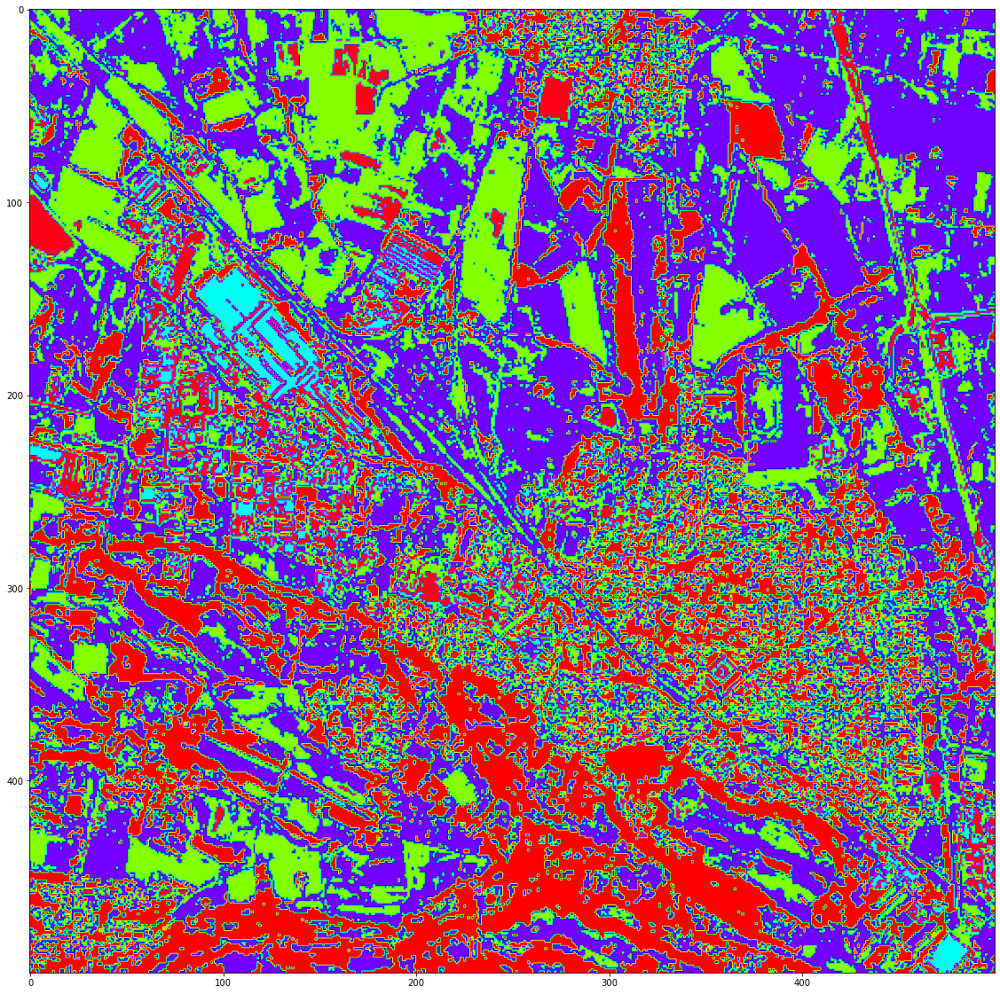

In [17]:
plt.figure(figsize=(20,20))
plt.imshow(X_cluster, cmap="hsv")
plt.show()

**2) CLASSIFY RGB + NIR**

In [5]:
img = np.zeros((rgb_nir_1075.RasterYSize, rgb_nir_1075.RasterXSize, rgb_nir_1075.RasterCount),
gdal_array.GDALTypeCodeToNumericTypeCode(rgb_nir_1075.GetRasterBand(1).DataType))
for b in range(img.shape[2]):
    img[:, :, b] = rgb_nir_1075.GetRasterBand(b + 1).ReadAsArray()

In [6]:
new_shape = (img.shape[0] * img.shape[1], img.shape[2])

In [7]:
X = img[:, :, :13].reshape(new_shape)

In [8]:
%%time

k_means = cluster.KMeans(n_clusters=8)
k_means.fit(X)

X_cluster = k_means.labels_
X_cluster = X_cluster.reshape(img[:, :, 0].shape)

CPU times: user 30.8 s, sys: 1.17 s, total: 32 s
Wall time: 4.61 s


/Users/magio94/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


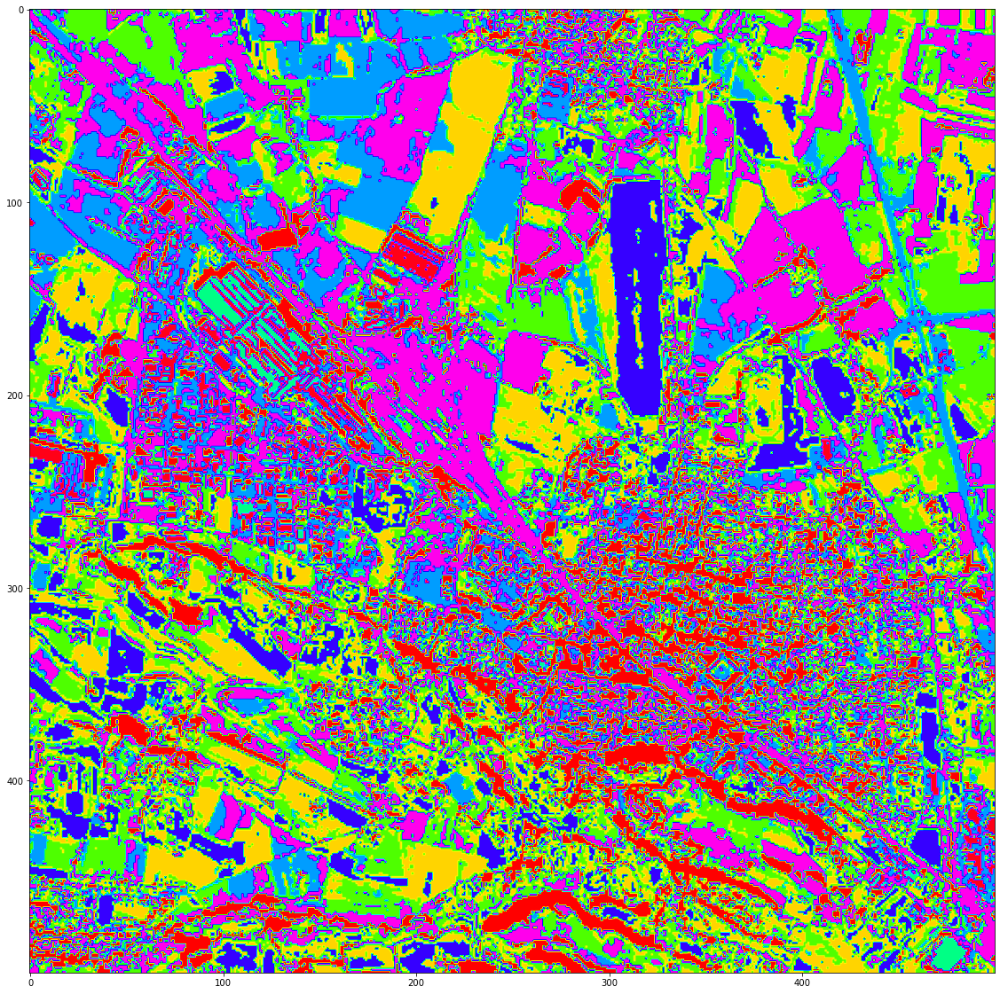

In [9]:
plt.figure(figsize=(20,20))
plt.imshow(X_cluster, cmap="hsv")
plt.show()

**3) CLASSIFY NDVI, NDWI AND NDBI**

In [3]:
img = np.zeros((NDVI_NDWI_NDBI_1075.RasterYSize, NDVI_NDWI_NDBI_1075.RasterXSize, NDVI_NDWI_NDBI_1075.RasterCount),
gdal_array.GDALTypeCodeToNumericTypeCode(NDVI_NDWI_NDBI_1075.GetRasterBand(1).DataType))
for b in range(img.shape[2]):
    img[:, :, b] = NDVI_NDWI_NDBI_1075.GetRasterBand(b + 1).ReadAsArray()

In [4]:
new_shape = (img.shape[0] * img.shape[1], img.shape[2])

In [5]:
X = img[:, :, :13].reshape(new_shape)

In [6]:
%%time

k_means = cluster.KMeans(n_clusters=8)
k_means.fit(X)

X_cluster = k_means.labels_
X_cluster = X_cluster.reshape(img[:, :, 0].shape)

CPU times: user 16.5 s, sys: 1.64 s, total: 18.1 s
Wall time: 2.89 s


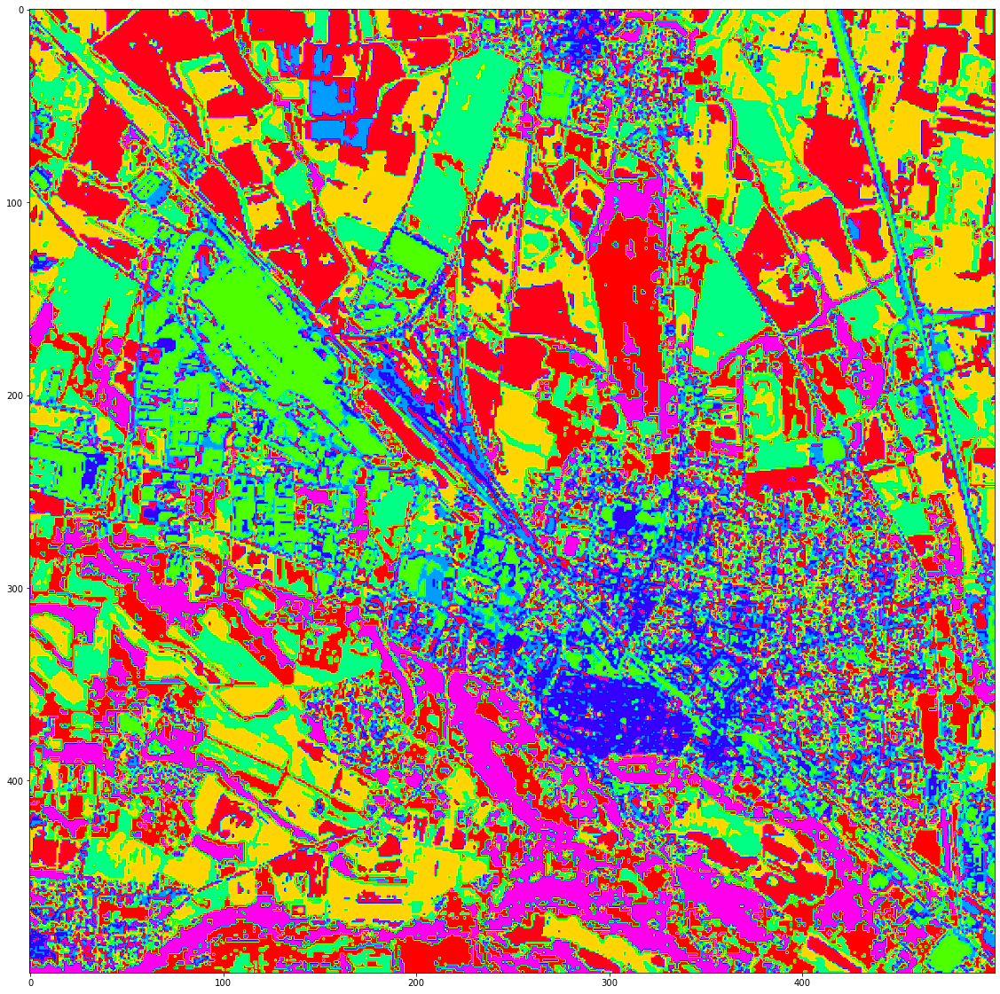

In [7]:
plt.figure(figsize=(20,20))
plt.imshow(X_cluster, cmap="hsv")
plt.show()

**4) CLASSIFY ALL BANDS**

In [34]:
img = np.zeros((allbands_1075.RasterYSize, allbands_1075.RasterXSize, allbands_1075.RasterCount),
gdal_array.GDALTypeCodeToNumericTypeCode(allbands_1075.GetRasterBand(1).DataType))
for b in range(img.shape[2]):
    img[:, :, b] = allbands_1075.GetRasterBand(b + 1).ReadAsArray()

In [35]:
new_shape = (img.shape[0] * img.shape[1], img.shape[2])

In [36]:
X = img[:, :, :13].reshape(new_shape)

In [41]:
%%time

k_means = cluster.KMeans(n_clusters=7)
k_means.fit(X)

X_cluster = k_means.labels_
X_cluster = X_cluster.reshape(img[:, :, 0].shape)

CPU times: user 25 s, sys: 2.23 s, total: 27.2 s
Wall time: 4.63 s


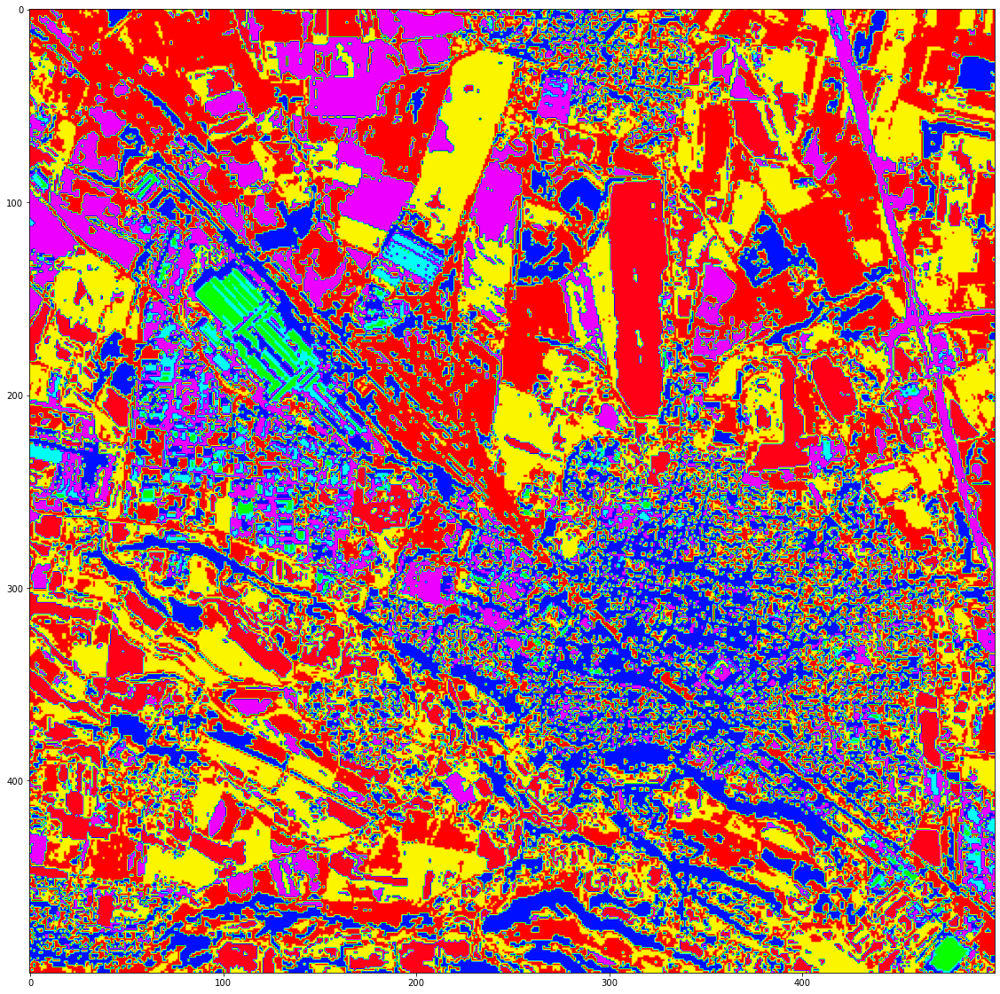

In [42]:
plt.figure(figsize=(20,20))
plt.imshow(X_cluster, cmap="hsv")
plt.show()

In [23]:
to_save = rasterio.open('GIS/Satellite images/saved_classification.tif', 'w', driver ='Gtiff',
                        width=b2_1075.width, height = b2_1075.height,
                        count=1,
                        crs=b2_1075.crs,
                        transform=b2_1075.transform,
                        dtype='int32',
                        profile=b2_1075.profile
                       )

to_save.write(X_cluster, 1)
to_save.close()

### Traing with a different algorithm 

In [6]:
img = np.zeros((ndvi_1075.RasterYSize, ndvi_1075.RasterXSize, ndvi_1075.RasterCount),
gdal_array.GDALTypeCodeToNumericTypeCode(ndvi_1075.GetRasterBand(1).DataType))
for b in range(img.shape[2]):
    img[:, :, b] = ndvi_1075.GetRasterBand(b + 1).ReadAsArray()

In [7]:
new_shape = (img.shape[0] * img.shape[1], img.shape[2])

In [8]:
X = img[:, :, :13].reshape(new_shape)

In [ ]:
%%time

k_means = cluster.AgglomerativeClustering(n_clusters=7)
k_means.fit(X)

X_cluster = k_means.labels_
X_cluster = X_cluster.reshape(img[:, :, 0].shape)

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(X_cluster, cmap="hsv")
plt.show()

## Supervised classification

In [26]:
CLC2018_clip = gpd.read_file('Training/CLC2018_cells_clip.shp')

In [27]:
CLC2018_clip_centroids = CLC2018_clip.copy()
CLC2018_clip_centroids.geometry = CLC2018_clip_centroids['geometry'].centroid
CLC2018_clip_centroids.crs = CLC2018_clip.crs
CLC2018_clip_centroids.head()

,Code_18,Remark,Area_Ha,ID,Shape_Leng,Shape_Area,GRID_CODE,CLC_CODE,LABEL1,LABEL2,LABEL3,RGB,geometry
0,111,None,32.559248,EU_766344,2559.666725,325592.47580,1,111,Artificial surfaces,Urban fabric,Continuous urban fabric,230-000-077,POINT (483010.828 4956308.006)
1,112,None,71.236822,EU_767453,5446.898966,712368.21660,2,112,Artificial surfaces,Urban fabric,Discontinuous urban fabric,255-000-000,POINT (468451.951 4940734.797)
2,112,None,35.052658,EU_767455,3464.592776,350526.58010,2,112,Artificial surfaces,Urban fabric,Discontinuous urban fabric,255-000-000,POINT (487504.627 4940872.612)
3,112,None,27.243362,EU_767469,3548.010356,272433.61790,2,112,Artificial surfaces,Urban fabric,Discontinuous urban fabric,255-000-000,POINT (477218.077 4942522.928)
4,112,None,32.449539,EU_767473,3599.621400,324495.39065,2,112,Artificial surfaces,Urban fabric,Discontinuous urban fabric,255-000-000,POINT (473709.909 4942704.229)


In [5]:
rgb_1075 = gdal.Open('GIS/Satellite images/trueColor_1075.tiff', gdal.GA_ReadOnly)
rgb_nir_1075 = gdal.Open('GIS/Satellite images/RGB_NIR_1075.tiff', gdal.GA_ReadOnly)
NDVI_NDWI_NDBI_1075 =  gdal.Open('GIS/Satellite images/NDVI_NDWI_NDBI_1075.tif', gdal.GA_ReadOnly)
allbands_1075 =  gdal.Open('GIS/Satellite images/allbands_1075.tif', gdal.GA_ReadOnly)

In [3]:
import lidario as lio

translator = lio.Translator('GIS/Satellite images/NDVI_NDWI_NDBI_1075.tif', "csv")
translator.translate("/path/to/file.tif", out_file='output.csv', no_data=0, band=1)

/Users/magio94/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


KeyError: 'GIS/Satellite images/NDVI_NDWI_NDBI_1075.tif'